<center>
<h1>
<hr/>
<b>
<u>
Project
</u>
</b>
<br/>
<hr/>
</h1>
</center>

In [ ]:

import json
import pymongo
import pandas as pd
from pymongo import MongoClient

import warnings
warnings.filterwarnings("ignore")


In [ ]:

# Imports a csv file at path csv_name to a mongo colection
# returns:  documants counts in the new collection

csv_path='../Datasets/supermarket_sales.csv'
db_name='projectdb'
coll_name='data_collection'
db_url='localhost'
db_port=27017

client = MongoClient(db_url, db_port)
db = client[db_name]
coll = db[coll_name]
data = pd.read_csv(csv_path)
payload = json.loads(data.to_json(orient='records'))
coll.remove()
coll.insert(payload)
coll.count()
  

1000

In [ ]:

# Show existing database names
client.list_database_names()


['admin', 'config', 'local', 'projectdb']

In [ ]:

# stats  show details about the client
client.stats    


Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'stats')

In [ ]:

# Show Collections. Query returns a Cursor [ ] ,  list it to see the content
# empty list '[]' means that there are not collections in database

list (db.list_collections())


[{'name': 'data_collection',
  'type': 'collection',
  'options': {},
  'info': {'readOnly': False,
   'uuid': UUID('f9ba16bc-bd8f-4816-9416-951aecfdd6f0')},
  'idIndex': {'v': 2, 'key': {'_id': 1}, 'name': '_id_'}}]

In [ ]:

list(db.data_collection.find())


[{'_id': ObjectId('609bef0575b13f510185d252'),
  'Invoice ID': '750-67-8428',
  'Branch': 'A',
  'City': 'Yangon',
  'Customer type': 'Member',
  'Gender': 'Female',
  'Product line': 'Health and beauty',
  'Unit price': 74.69,
  'Quantity': 7,
  'Tax 5%': 26.1415,
  'Total': 548.9715,
  'Date': '1/5/2019',
  'Time': '13:08',
  'Payment': 'Ewallet',
  'cogs': 522.83,
  'gross margin percentage': 4.761904762,
  'gross income': 26.1415,
  'Rating': 9.1},
 {'_id': ObjectId('609bef0575b13f510185d253'),
  'Invoice ID': '226-31-3081',
  'Branch': 'C',
  'City': 'Naypyitaw',
  'Customer type': 'Normal',
  'Gender': 'Female',
  'Product line': 'Electronic accessories',
  'Unit price': 15.28,
  'Quantity': 5,
  'Tax 5%': 3.82,
  'Total': 80.22,
  'Date': '3/8/2019',
  'Time': '10:29',
  'Payment': 'Cash',
  'cogs': 76.4,
  'gross margin percentage': 4.761904762,
  'gross income': 3.82,
  'Rating': 9.6},
 {'_id': ObjectId('609bef0575b13f510185d254'),
  'Invoice ID': '631-41-3108',
  'Branch': 'A

In [ ]:

collection=db.data_collection


In [ ]:

list ( collection.find() )  


[{'_id': ObjectId('609bef0575b13f510185d252'),
  'Invoice ID': '750-67-8428',
  'Branch': 'A',
  'City': 'Yangon',
  'Customer type': 'Member',
  'Gender': 'Female',
  'Product line': 'Health and beauty',
  'Unit price': 74.69,
  'Quantity': 7,
  'Tax 5%': 26.1415,
  'Total': 548.9715,
  'Date': '1/5/2019',
  'Time': '13:08',
  'Payment': 'Ewallet',
  'cogs': 522.83,
  'gross margin percentage': 4.761904762,
  'gross income': 26.1415,
  'Rating': 9.1},
 {'_id': ObjectId('609bef0575b13f510185d253'),
  'Invoice ID': '226-31-3081',
  'Branch': 'C',
  'City': 'Naypyitaw',
  'Customer type': 'Normal',
  'Gender': 'Female',
  'Product line': 'Electronic accessories',
  'Unit price': 15.28,
  'Quantity': 5,
  'Tax 5%': 3.82,
  'Total': 80.22,
  'Date': '3/8/2019',
  'Time': '10:29',
  'Payment': 'Cash',
  'cogs': 76.4,
  'gross margin percentage': 4.761904762,
  'gross income': 3.82,
  'Rating': 9.6},
 {'_id': ObjectId('609bef0575b13f510185d254'),
  'Invoice ID': '631-41-3108',
  'Branch': 'A

<center>
    <hr/>
    <h1>
    <b>
        Mongodb Query
    </b>
    </h1>
    <hr/>
</center>

> ## **Q1**: Is there any difference in aggregate sales across branches?

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : {"Branch" : "$Branch"},
                    "Sales sum": { "$sum" : "$Total"}
                   } 
    }
])

for i in result:
    print(i)


{'_id': {'Branch': 'A'}, 'Sales sum': 106200.3705}
{'_id': {'Branch': 'B'}, 'Sales sum': 106197.672}
{'_id': {'Branch': 'C'}, 'Sales sum': 110568.7065}


> ### There is not much difference in sales across the 3 branches of A, B and C. The sales in branch C is a bit higher than the rest of the branches.

> ## **Q2**: Which is the most pouplar payment method used by customers?

In [ ]:
collection.find_one(sort=[("Payment", pymongo.DESCENDING)])

{'_id': ObjectId('609bef0575b13f510185d252'),
 'Invoice ID': '750-67-8428',
 'Branch': 'A',
 'City': 'Yangon',
 'Customer type': 'Member',
 'Gender': 'Female',
 'Product line': 'Health and beauty',
 'Unit price': 74.69,
 'Quantity': 7,
 'Tax 5%': 26.1415,
 'Total': 548.9715,
 'Date': '1/5/2019',
 'Time': '13:08',
 'Payment': 'Ewallet',
 'cogs': 522.83,
 'gross margin percentage': 4.761904762,
 'gross income': 26.1415,
 'Rating': 9.1}



> ### The most popular payment method is in-fact E-wallet and not credit cards.

> ## **Q3**: Which branch is the most profitable?

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : {"Branch" : "$Branch"},
                     "Gross Income sum": { "$sum" : "$gross income"},
                    "Sales sum": { "$sum" : "$Total"}
                   } 
    }
])

for i in result:
    print(i)
    


{'_id': {'Branch': 'A'}, 'Gross Income sum': 5057.1605, 'Sales sum': 106200.3705}
{'_id': {'Branch': 'B'}, 'Gross Income sum': 5057.032, 'Sales sum': 106197.672}
{'_id': {'Branch': 'C'}, 'Gross Income sum': 5265.1765, 'Sales sum': 110568.7065}


> ### There is not much difference in gross income by branches at an average level. Branch C has a slightly higher income than A or B, As observed earlier, though branch A has slightly higher sales than the rest C is the most profitable branch in terms of gross income.

> ## **Q4**: What is the relationship between Gender and Gross income?

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : {"Gender" : "$Gender"},
                     "Gross Income sum": { "$sum" : "$gross income"}
                   } 
    }
])

for i in result:
    print(i)
    

{'_id': {'Gender': 'Male'}, 'Gross Income sum': 7384.944}
{'_id': {'Gender': 'Female'}, 'Gross Income sum': 7994.425}


> ### Gross income is similar for both male and female, though female customers spend a bit higher at the 75th percentile.

> ## **Q5**:What is the spending patterns of females and males and in which category do they spend a lot?

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : {"Gender" : "$Gender", "Product line" : "$Product line"},
                     "Product Line Sale": { "$sum" : "$Total"}
                   } 
    }
])

for i in result:
    print(i)
    

{'_id': {'Gender': 'Male', 'Product line': 'Food and beverages'}, 'Product Line Sale': 22973.9265}
{'_id': {'Gender': 'Male', 'Product line': 'Electronic accessories'}, 'Product Line Sale': 27235.509}
{'_id': {'Gender': 'Female', 'Product line': 'Health and beauty'}, 'Product Line Sale': 18560.9865}
{'_id': {'Gender': 'Female', 'Product line': 'Electronic accessories'}, 'Product Line Sale': 27102.0225}
{'_id': {'Gender': 'Male', 'Product line': 'Home and lifestyle'}, 'Product Line Sale': 23825.0355}
{'_id': {'Gender': 'Male', 'Product line': 'Health and beauty'}, 'Product Line Sale': 30632.7525}
{'_id': {'Gender': 'Female', 'Product line': 'Food and beverages'}, 'Product Line Sale': 33170.9175}
{'_id': {'Gender': 'Female', 'Product line': 'Fashion accessories'}, 'Product Line Sale': 30437.4}
{'_id': {'Gender': 'Male', 'Product line': 'Fashion accessories'}, 'Product Line Sale': 23868.495}
{'_id': {'Gender': 'Male', 'Product line': 'Sports and travel'}, 'Product Line Sale': 26548.105499

> ### Females spend on 'fashion accessories' the most and for males surprisingly it is 'Health and beauty'. Females also spend more on 'Sports and travel'

> ## **Q6**: Find the number of customer in the branches using Ewallet as Payment mode?

In [ ]:
result = collection.aggregate([
    {
        "$match" : 
                 {"Payment" : { "$regex": "Ewallet" } }
    },
    {
        "$count" : "total_rows"
    }
])

for i in result:
    print(i)

{'total_rows': 345}



> ### 345 customers of the branches use Ewallet as the payment mode.

> ## Q7: Count the number of Males and Females in the branch?

In [ ]:
result = collection.aggregate([
    {
        "$match" : 
                 {"Gender" : {"$eq" : 'Male' } }
    },
    {
        "$count" : "total_rows"
    }
])

for i in result:
    print(i)

result = collection.aggregate([
    {
        "$match" : 
                 {"Gender" : {"$eq" : 'Female' } }
    },
    {
        "$count" : "total_rows"
    }
])

for i in result:
    print(i)

{'total_rows': 499}
{'total_rows': 501}


> ### Total number of males are 499 and total number of females are 501 in all the branches collectively.


> ## **Q8**: Which product line should the supermarket focus on?
> ### **a)** Rating of products

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : "$Product line",
                     "Product Rating": { "$sum" : "$Rating"}
                   } 
    }
])

for i in result:
    print(i)

{'_id': 'Health and beauty', 'Product Rating': 1064.5}
{'_id': 'Home and lifestyle', 'Product Rating': 1094.0}
{'_id': 'Sports and travel', 'Product Rating': 1148.1}
{'_id': 'Food and beverages', 'Product Rating': 1237.7}
{'_id': 'Fashion accessories', 'Product Rating': 1251.2}
{'_id': 'Electronic accessories', 'Product Rating': 1177.2}


> ### **b)** Quantity purchased by product

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : "$Product line",
                     "Product Rating": { "$sum" : "$Quantity"}
                   } 
    }
])

for i in result:
    print(i)

{'_id': 'Health and beauty', 'Product Rating': 854}
{'_id': 'Home and lifestyle', 'Product Rating': 911}
{'_id': 'Sports and travel', 'Product Rating': 920}
{'_id': 'Food and beverages', 'Product Rating': 952}
{'_id': 'Fashion accessories', 'Product Rating': 902}
{'_id': 'Electronic accessories', 'Product Rating': 971}


> ### Though the rating for 'fashion accessories' and 'food and beverages' is high but quantity purchased is low. Hence, supply for these products need to be increased.

> ## **Q9**: Which city should be chosen for expansion and which products should it focus on?

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : {"City" : "$City", "Product line" : "$Product line"},
                     "Product Line Sale": { "$sum" : "$Total"}
                   } 
    }
])

for i in result:
    print(i)
    

{'_id': {'City': 'Naypyitaw', 'Product line': 'Food and beverages'}, 'Product Line Sale': 23766.855}
{'_id': {'City': 'Mandalay', 'Product line': 'Home and lifestyle'}, 'Product Line Sale': 17549.1645}
{'_id': {'City': 'Yangon', 'Product line': 'Home and lifestyle'}, 'Product Line Sale': 22417.1955}
{'_id': {'City': 'Naypyitaw', 'Product line': 'Home and lifestyle'}, 'Product Line Sale': 13895.553}
{'_id': {'City': 'Mandalay', 'Product line': 'Electronic accessories'}, 'Product Line Sale': 17051.4435}
{'_id': {'City': 'Naypyitaw', 'Product line': 'Electronic accessories'}, 'Product Line Sale': 18968.9745}
{'_id': {'City': 'Naypyitaw', 'Product line': 'Sports and travel'}, 'Product Line Sale': 15761.928}
{'_id': {'City': 'Yangon', 'Product line': 'Sports and travel'}, 'Product Line Sale': 19372.6995}
{'_id': {'City': 'Naypyitaw', 'Product line': 'Fashion accessories'}, 'Product Line Sale': 21560.07}
{'_id': {'City': 'Yangon', 'Product line': 'Food and beverages'}, 'Product Line Sale': 1

> ### It is obvious that Naypyitaw is the most profitable city, hence the expansion plan should be based on this city.

> ### Fashion accessories and food and beverages are the most sold product in Naypyitaw and these products should be focused on for expansion along with electronic accessories.

> ## **Q10**: Product sales on the basis of gender

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : "$Gender",
                     "Product Sales": { "$sum" : "$Total"}
                    } 
    }
])

for i in result:
    print(i)

{'_id': 'Male', 'Product Sales': 155083.824}
{'_id': 'Female', 'Product Sales': 167882.925}


> ### Fashion accessories, Food and beverages are the most bought products by Female customers. Electronic accessories, Health and beauty are the most bought products by Male customers.

> ## Q11: List the Product Line of all the Branches?

In [ ]:
for x in collection.find({},{ "_id": 0, "Branch": 1, "Product line": 1 }):
  print(x)

{'Branch': 'A', 'Product line': 'Health and beauty'}
{'Branch': 'C', 'Product line': 'Electronic accessories'}
{'Branch': 'A', 'Product line': 'Home and lifestyle'}
{'Branch': 'A', 'Product line': 'Health and beauty'}
{'Branch': 'A', 'Product line': 'Sports and travel'}
{'Branch': 'C', 'Product line': 'Electronic accessories'}
{'Branch': 'A', 'Product line': 'Electronic accessories'}
{'Branch': 'C', 'Product line': 'Home and lifestyle'}
{'Branch': 'A', 'Product line': 'Health and beauty'}
{'Branch': 'B', 'Product line': 'Food and beverages'}
{'Branch': 'B', 'Product line': 'Fashion accessories'}
{'Branch': 'B', 'Product line': 'Electronic accessories'}
{'Branch': 'A', 'Product line': 'Electronic accessories'}
{'Branch': 'A', 'Product line': 'Food and beverages'}
{'Branch': 'A', 'Product line': 'Health and beauty'}
{'Branch': 'B', 'Product line': 'Sports and travel'}
{'Branch': 'A', 'Product line': 'Health and beauty'}
{'Branch': 'A', 'Product line': 'Sports and travel'}
{'Branch': 'A',

> ## **Q12:** average ratings of products.

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : "$Product line" ,
                     "average_Rating": { "$avg" : "$Rating"}
                } 
    }
])

for i in result:
    print(i)

{'_id': 'Health and beauty', 'average_Rating': 7.003289473684211}
{'_id': 'Home and lifestyle', 'average_Rating': 6.8375}
{'_id': 'Sports and travel', 'average_Rating': 6.916265060240963}
{'_id': 'Food and beverages', 'average_Rating': 7.113218390804598}
{'_id': 'Fashion accessories', 'average_Rating': 7.0292134831460675}
{'_id': 'Electronic accessories', 'average_Rating': 6.924705882352941}


> ## **Q13:** Average Rating of the product in each branch.

In [ ]:
result = collection.aggregate([
    {
        "$group" : { "_id" : "$Branch" ,
                     "average_Rating": { "$avg" : "$Rating"}
                } 
    }
])

for i in result:
    print(i)

{'_id': 'A', 'average_Rating': 7.027058823529411}
{'_id': 'B', 'average_Rating': 6.8180722891566266}
{'_id': 'C', 'average_Rating': 7.072865853658537}


> ### We can see that the average rating of branch A and C is more than seven and branch B is less than 7.

## **Q14:** How many product line purchased by Health and beauty type of Customer type .

In [ ]:
result = collection.aggregate([
    {
        "$match" : 
                 {"Product line" : {"$eq" : 'Health and beauty' } }
    },
    {
        "$count" : "total_rows"
    }
])

for i in result:
    print(i)

{'total_rows': 152}


> ## **Q15**: Which Month has maximum sales?

In [ ]:
collection.find_one(sort=[("Total", pymongo.DESCENDING)])

{'_id': ObjectId('609bef0575b13f510185d3b0'),
 'Invoice ID': '860-79-0874',
 'Branch': 'C',
 'City': 'Naypyitaw',
 'Customer type': 'Member',
 'Gender': 'Female',
 'Product line': 'Fashion accessories',
 'Unit price': 99.3,
 'Quantity': 10,
 'Tax 5%': 49.65,
 'Total': 1042.65,
 'Date': '2/15/2019',
 'Time': '14:53',
 'Payment': 'Credit card',
 'cogs': 993.0,
 'gross margin percentage': 4.761904762,
 'gross income': 49.65,
 'Rating': 6.6}

> ### Sales are highest in the month of February.

> ## **Q16:** Which Product line has highest cogs ?

In [ ]:
collection.find_one(sort=[("cogs", pymongo.DESCENDING)])

{'_id': ObjectId('609bef0575b13f510185d3b0'),
 'Invoice ID': '860-79-0874',
 'Branch': 'C',
 'City': 'Naypyitaw',
 'Customer type': 'Member',
 'Gender': 'Female',
 'Product line': 'Fashion accessories',
 'Unit price': 99.3,
 'Quantity': 10,
 'Tax 5%': 49.65,
 'Total': 1042.65,
 'Date': '2/15/2019',
 'Time': '14:53',
 'Payment': 'Credit card',
 'cogs': 993.0,
 'gross margin percentage': 4.761904762,
 'gross income': 49.65,
 'Rating': 6.6}


> ### Home and lifestyle, Sports and travel has highest cogs.


> ## **Q17:** Which Branch has highest gross icome




In [ ]:
collection.find_one(sort=[("gross income", pymongo.DESCENDING)])

{'_id': ObjectId('609bef0575b13f510185d3b0'),
 'Invoice ID': '860-79-0874',
 'Branch': 'C',
 'City': 'Naypyitaw',
 'Customer type': 'Member',
 'Gender': 'Female',
 'Product line': 'Fashion accessories',
 'Unit price': 99.3,
 'Quantity': 10,
 'Tax 5%': 49.65,
 'Total': 1042.65,
 'Date': '2/15/2019',
 'Time': '14:53',
 'Payment': 'Credit card',
 'cogs': 993.0,
 'gross margin percentage': 4.761904762,
 'gross income': 49.65,
 'Rating': 6.6}

> ### Branch C have highest gross income.

<center>
    <hr/>
    <h1>
    <b>
       Visualization , Prediction and Pre-processing for Machine Learning model 
    </b>
    </h1>
    <hr/>
</center>

In [ ]:

import os
import math
import time
import random
import datetime
import operator 
import numpy as np  
import seaborn as sns

from pylab import rcParams
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors


from IPython.display import set_matplotlib_formats

%matplotlib inline
plt.style.use('fivethirtyeight')
set_matplotlib_formats('retina')


In [ ]:

df=data
df.head(10)


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3
5,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,3/25/2019,18:30,Ewallet,597.73,4.761905,29.8865,4.1
6,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,2/25/2019,14:36,Ewallet,413.04,4.761905,20.6520,5.8
7,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2/24/2019,11:38,Ewallet,735.60,4.761905,36.7800,8.0
8,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,1/10/2019,17:15,Credit card,72.52,4.761905,3.6260,7.2
9,692-92-5582,B,Mandalay,Member,Female,Food and beverages,54.84,3,8.2260,172.7460,2/20/2019,13:27,Credit card,164.52,4.761905,8.2260,5.9


## Variable transformations
## Change the date variable to date

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df['Time'] = pd.to_datetime(df['Time'])

In [ ]:
df['weekday'] = df['Date'].dt.day_name()
df['day'] = (df['Date']).dt.day
df['month'] = df['Date'].dt.month_name()
df['year'] = (df['Date']).dt.year
df['Hour'] = (df['Time']).dt.hour 

In [ ]:
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,Payment,cogs,gross margin percentage,gross income,Rating,weekday,day,month,year,Hour
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,...,Ewallet,522.83,4.761905,26.1415,9.1,Saturday,5,January,2019,13
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,...,Cash,76.40,4.761905,3.8200,9.6,Friday,8,March,2019,10
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,...,Credit card,324.31,4.761905,16.2155,7.4,Sunday,3,March,2019,13
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,...,Ewallet,465.76,4.761905,23.2880,8.4,Sunday,27,January,2019,20
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,...,Ewallet,604.17,4.761905,30.2085,5.3,Friday,8,February,2019,10


In [ ]:

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Invoice ID               1000 non-null   object        
 1   Branch                   1000 non-null   object        
 2   City                     1000 non-null   object        
 3   Customer type            1000 non-null   object        
 4   Gender                   1000 non-null   object        
 5   Product line             1000 non-null   object        
 6   Unit price               1000 non-null   float64       
 7   Quantity                 1000 non-null   int64         
 8   Tax 5%                   1000 non-null   float64       
 9   Total                    1000 non-null   float64       
 10  Date                     1000 non-null   datetime64[ns]
 11  Time                     1000 non-null   datetime64[ns]
 12  Payment                  1000 non-n

In [ ]:

df.isna().sum()


Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
weekday                    0
day                        0
month                      0
year                       0
Hour                       0
dtype: int64

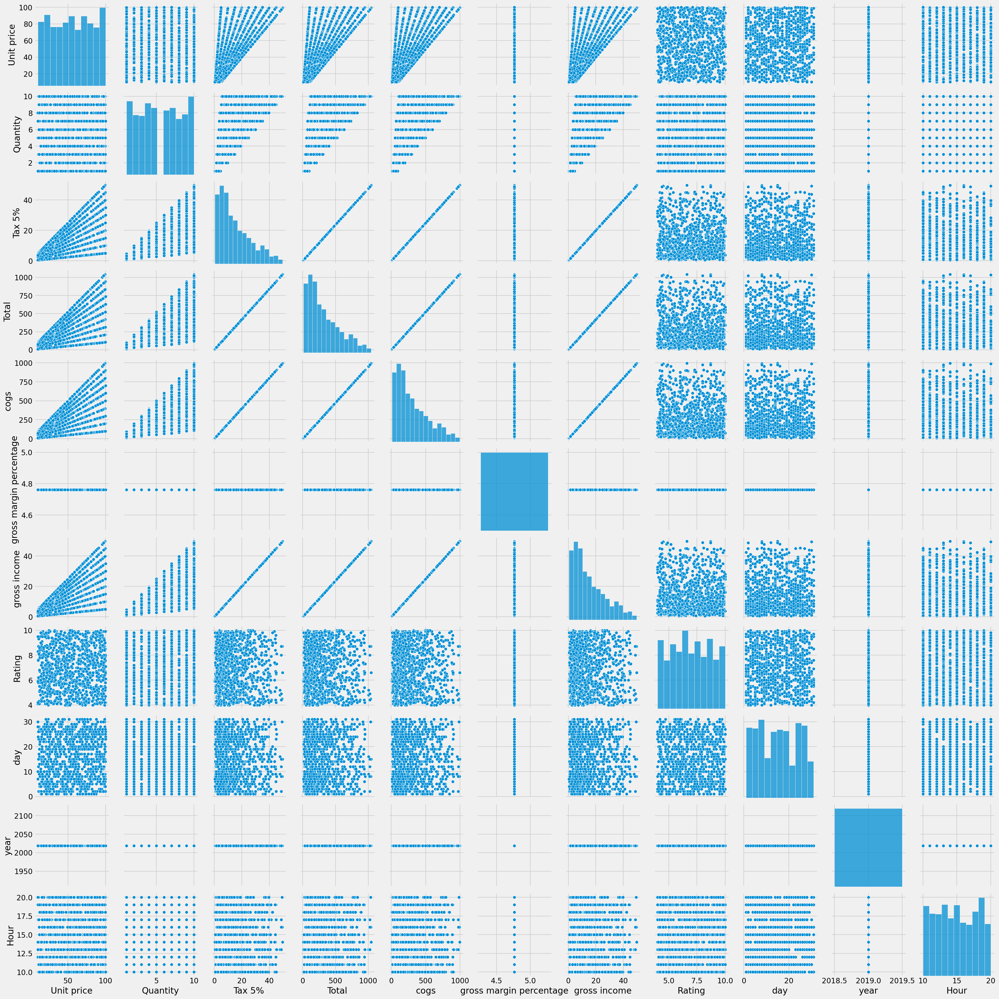

In [ ]:

# Pair plot for better visualization
sns.pairplot(df)


> ## Correlation analysis
> ## Pairwise correlations

In [ ]:

# Finding correlation between features

rcParams['figure.figsize'] =40,20
sns.set(font_scale=2)
corr=df.corr()
corr


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,day,year,Hour
Unit price,1.000000e+00,1.077756e-02,6.339621e-01,6.339621e-01,6.339621e-01,-6.998957e-16,6.339621e-01,-8.777507e-03,5.702090e-02,NaN,8.242210e-03
Quantity,1.077756e-02,1.000000e+00,7.055102e-01,7.055102e-01,7.055102e-01,-3.849075e-16,7.055102e-01,-1.581490e-02,-4.334686e-02,NaN,-7.316886e-03
Tax 5%,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.461896e-16,1.000000e+00,-3.644170e-02,-2.514770e-03,NaN,-2.770440e-03
Total,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.408632e-16,1.000000e+00,-3.644170e-02,-2.514770e-03,NaN,-2.770440e-03
cogs,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.439279e-15,1.000000e+00,-3.644170e-02,-2.514770e-03,NaN,-2.770440e-03
gross margin percentage,-6.998957e-16,-3.849075e-16,2.461896e-16,2.408632e-16,1.439279e-15,1.000000e+00,2.461896e-16,2.042714e-15,-4.999832e-16,NaN,-2.114722e-16
gross income,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.461896e-16,1.000000e+00,-3.644170e-02,-2.514770e-03,NaN,-2.770440e-03
Rating,-8.777507e-03,-1.581490e-02,-3.644170e-02,-3.644170e-02,-3.644170e-02,2.042714e-15,-3.644170e-02,1.000000e+00,-7.075821e-03,NaN,-3.058764e-02
day,5.702090e-02,-4.334686e-02,-2.514770e-03,-2.514770e-03,-2.514770e-03,-4.999832e-16,-2.514770e-03,-7.075821e-03,1.000000e+00,NaN,2.066810e-02
year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


> ## Visualize correlations

<AxesSubplot:>

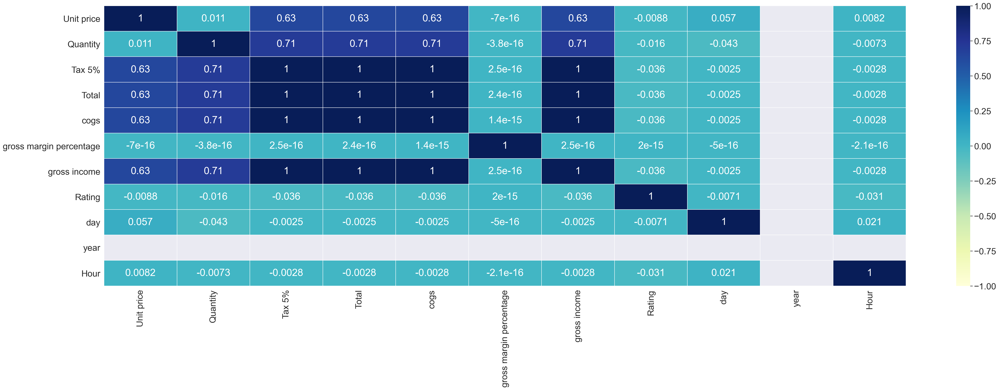

In [ ]:

# Heatmap

rcParams['figure.figsize'] =40,12
sns.heatmap(corr, xticklabels=corr.columns.values,yticklabels=corr.columns.values,annot=True,linewidths=.5,cmap="YlGnBu",annot_kws={"size":25},vmin=-1,vmax=1)


> ##  Count each type of customers.

In [ ]:

df['Customer type'].value_counts()


Member    501
Normal    499
Name: Customer type, dtype: int64

> ## Visualization each type of customers

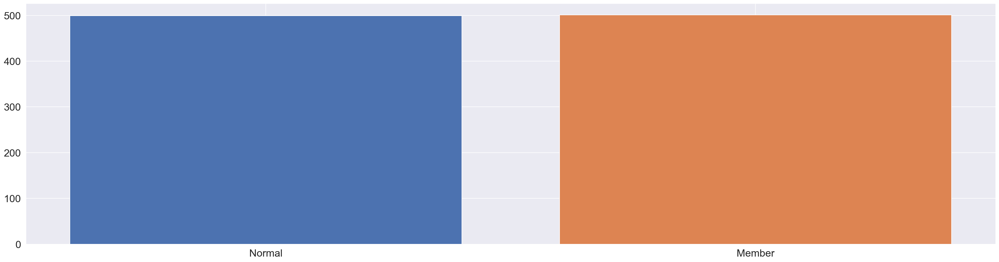

In [ ]:

plt.figure(figsize=(30, 8))

plt.bar('Normal',df[df['Customer type']=='Normal'].value_counts().sum())
plt.bar('Member',df[df['Customer type']=='Member'].value_counts().sum())

plt.xticks(size=20)
plt.yticks(size=20)
plt.show();


> ## Count how many customers are male and female

In [ ]:

df['Gender'].value_counts()


Female    501
Male      499
Name: Gender, dtype: int64

> ## Visualization how many customers are male and female

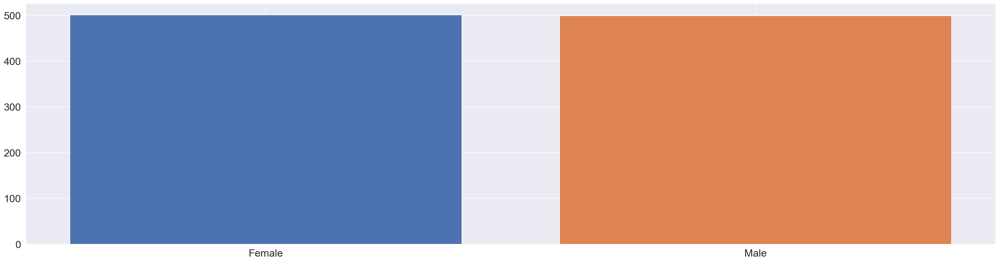

In [ ]:

plt.figure(figsize=(30, 8))

plt.bar('Female',df[df['Gender']=='Female'].value_counts().sum())
plt.bar('Male',df[df['Gender']=='Male'].value_counts().sum())

plt.xticks(size=20)
plt.yticks(size=20)
plt.show();


> ## Count the each product line.

In [ ]:

df['Product line'].value_counts()


Fashion accessories       178
Food and beverages        174
Electronic accessories    170
Sports and travel         166
Home and lifestyle        160
Health and beauty         152
Name: Product line, dtype: int64

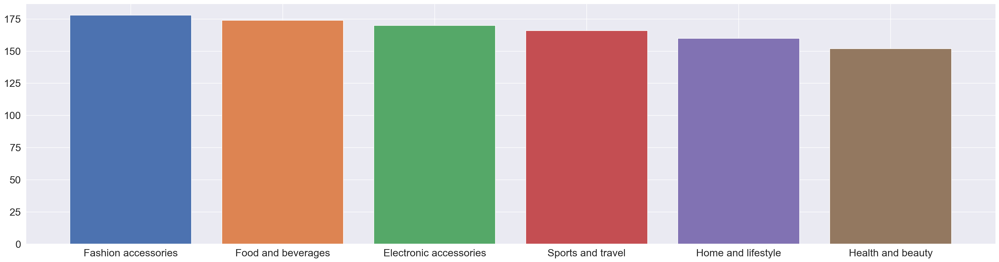

In [ ]:

plt.figure(figsize=(30, 8))

plt.bar('Fashion accessories',df[df['Product line']=='Fashion accessories'].value_counts().sum())
plt.bar('Food and beverages',df[df['Product line']=='Food and beverages'].value_counts().sum())
plt.bar('Electronic accessories',df[df['Product line']=='Electronic accessories'].value_counts().sum())
plt.bar('Sports and travel',df[df['Product line']=='Sports and travel'].value_counts().sum())
plt.bar('Home and lifestyle',df[df['Product line']=='Home and lifestyle'].value_counts().sum())
plt.bar('Health and beauty',df[df['Product line']=='Health and beauty'].value_counts().sum())


plt.xticks(size=20)
plt.yticks(size=20)
plt.show();


<center>
<h4>
<hr/>
<b>
<u>
Univariate analysis
</u>
<br/>
</b>
<hr/>
</h4>
</center>

> ## Q1: What does the customer rating look like and is it skewed?


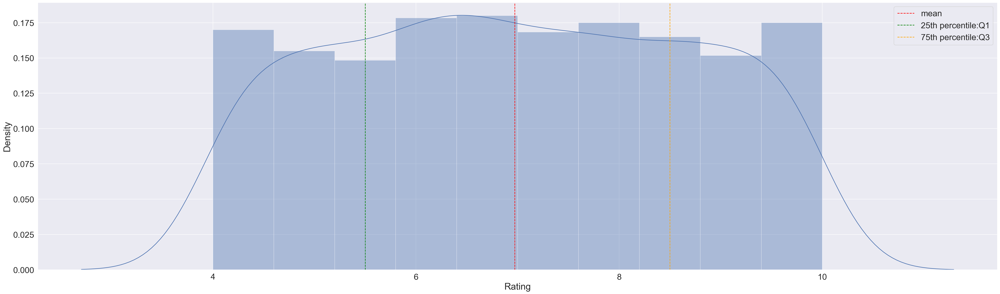

In [ ]:
sns.distplot(df['Rating'])
plt.axvline(x=np.mean(df['Rating']), c='red', ls='--', label='mean')
plt.axvline(x=np.percentile(df['Rating'],25),c='green', ls='--', label = '25th percentile:Q1')
plt.axvline(x=np.percentile(df['Rating'],75),c='orange', ls='--',label = '75th percentile:Q3' )
plt.legend();

> ### The rating distribution looks uniform and there seems to be no skewness on the left or right side of the distribution. We can plot the mean and the percentiles to show this as well. The red dotted lime is the mean and the green and orange lines indicate the 25th and 75th quartiles respectively.The mean rating is ~7 across products.

> ## Q2: Is there any difference in aggregate sales across branches?

<AxesSubplot:xlabel='Branch', ylabel='count'>

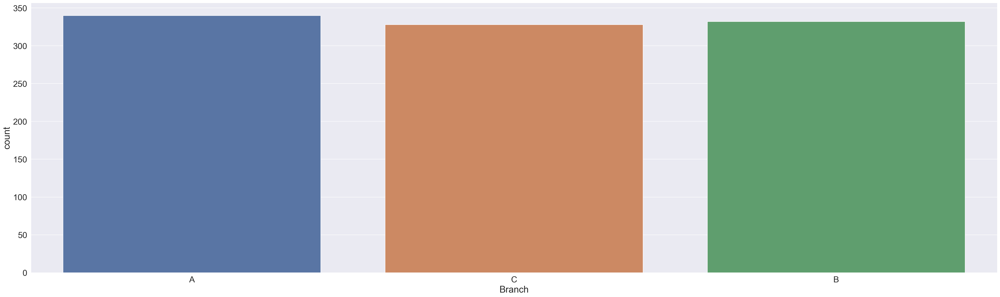

In [ ]:


sns.countplot(df['Branch'])



> ### There is not much difference in sales across the 3 branches of A, B and C. The sales in branch A is a bit higher than the rest of the branches.

> ## Q3: Which is the most pouplar payment method used by customers?

<AxesSubplot:xlabel='Payment', ylabel='count'>

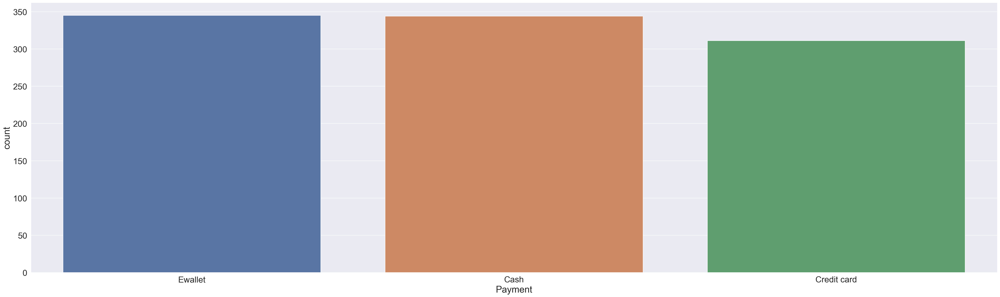

In [ ]:
sns.countplot(df['Payment'])



> ### The most popular payment method is in-fact E-wallet and not credit cards.


<center>
<h4>
<hr/>
<b>
<u>
Bi-Variate Analysis
</u>
<br/>
</b>
<hr/>
</h4>
</center>

> ## Q4: Does gross income affect the ratings that the customers provide?


<AxesSubplot:xlabel='Rating', ylabel='gross income'>

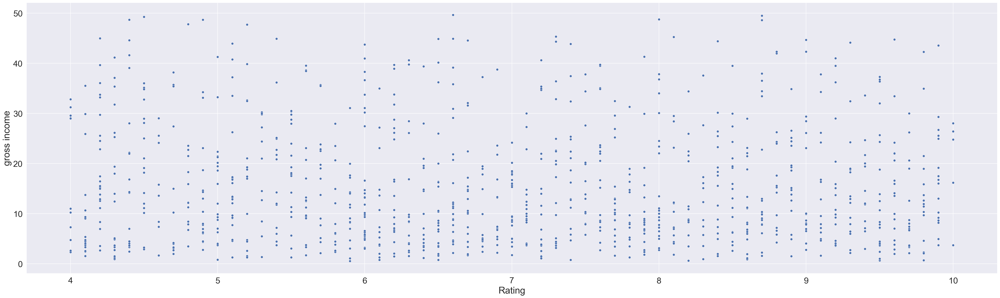

In [ ]:


sns.scatterplot(df['Rating'], df['gross income'])



<AxesSubplot:xlabel='Rating', ylabel='gross income'>

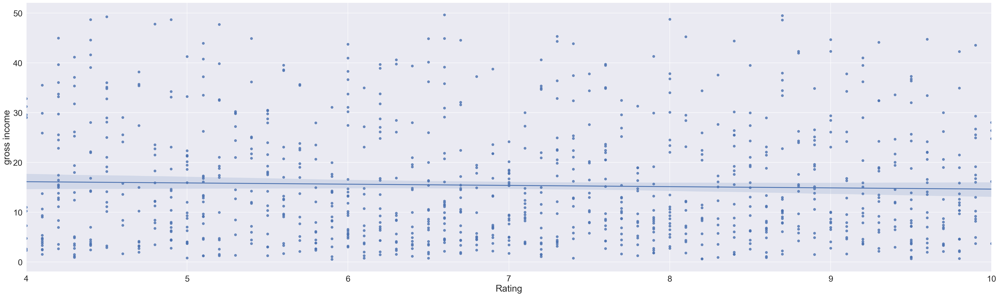

In [ ]:
sns.regplot(df['Rating'], df['gross income'])

> ### As you can see from the scatter plot and the trend line which is pretty flat that there is no relationship between gross income of a customer and his rating

> ## Q5: Which branch is the most profitable?

<AxesSubplot:xlabel='Branch', ylabel='gross income'>

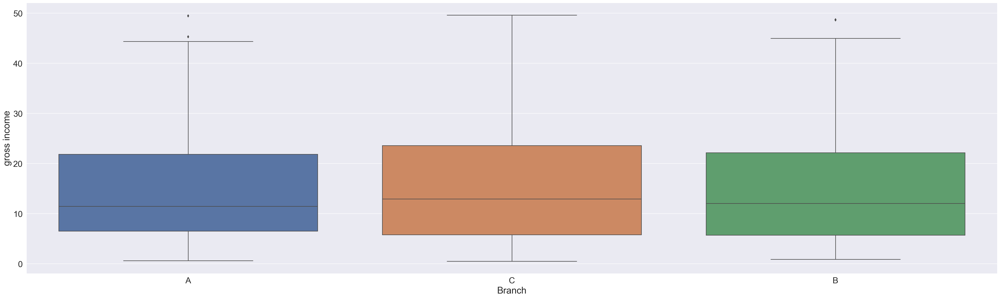

In [ ]:
sns.boxplot(x=df['Branch'], y=df['gross income'])

> ### There is not much difference in gross income by branches at an average level. Branch C has a slightly higher income than A or B, As observed earlier, though branch A has slightly higher sales than the rest C is the most profitable branch in terms of gross income.

> ## Q6: What is the relationship between Gender and Gross income?

<AxesSubplot:xlabel='Gender', ylabel='gross income'>

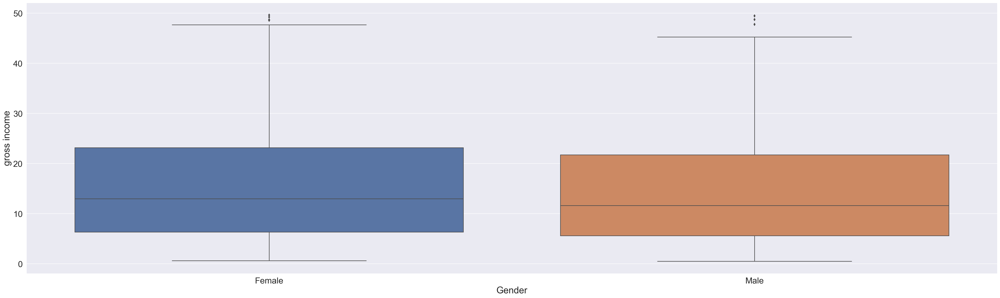

In [ ]:
sns.boxplot(x=df['Gender'], y=df['gross income'])


> ### Gross income is similar for both male and female, though female customers spend a bit higher at the 75th percentile.

> ## Q7: Is there any time trend in gross income?

In [ ]:
df.groupby(df.index).mean()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,day,year,Hour
0,74.69,7,26.1415,548.9715,522.83,4.761905,26.1415,9.1,5,2019,13
1,15.28,5,3.8200,80.2200,76.40,4.761905,3.8200,9.6,8,2019,10
2,46.33,7,16.2155,340.5255,324.31,4.761905,16.2155,7.4,3,2019,13
3,58.22,8,23.2880,489.0480,465.76,4.761905,23.2880,8.4,27,2019,20
4,86.31,7,30.2085,634.3785,604.17,4.761905,30.2085,5.3,8,2019,10
...,...,...,...,...,...,...,...,...,...,...,...
995,40.35,1,2.0175,42.3675,40.35,4.761905,2.0175,6.2,29,2019,13
996,97.38,10,48.6900,1022.4900,973.80,4.761905,48.6900,4.4,2,2019,17
997,31.84,1,1.5920,33.4320,31.84,4.761905,1.5920,7.7,9,2019,13
998,65.82,1,3.2910,69.1110,65.82,4.761905,3.2910,4.1,22,2019,15


> ### There are multiple dates per customers, so we have to summarize the data. We will use date as the index for this and for summarization we will use mean value of the variables. We get 89 rows i.e 89 unique days of data across all customers

<AxesSubplot:ylabel='gross income'>

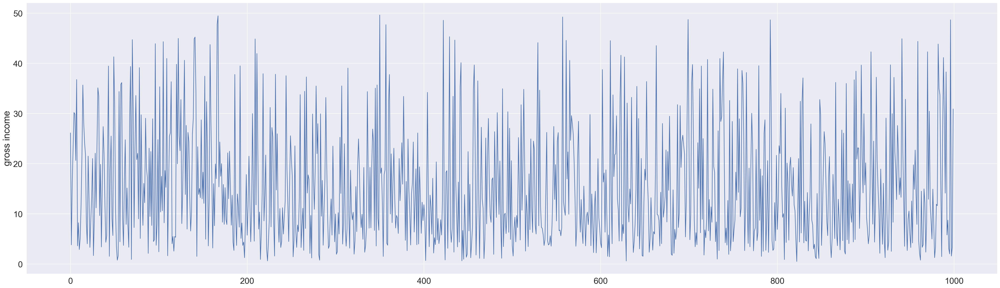

In [ ]:
sns.lineplot(x= df.groupby(df.index).mean().index, 
             y = df.groupby(df.index).mean()['gross income'])

> ### No particular time trend except for some days the gross income is pretty high and some days it is pretty low. Overall it remains at a certain average level.

> ## Q8:What is the spending patterns of females and males and in which category do they spend a lot?

<AxesSubplot:title={'center':'Total Monthly transaction by Gender'}, xlabel='Product line', ylabel='count'>

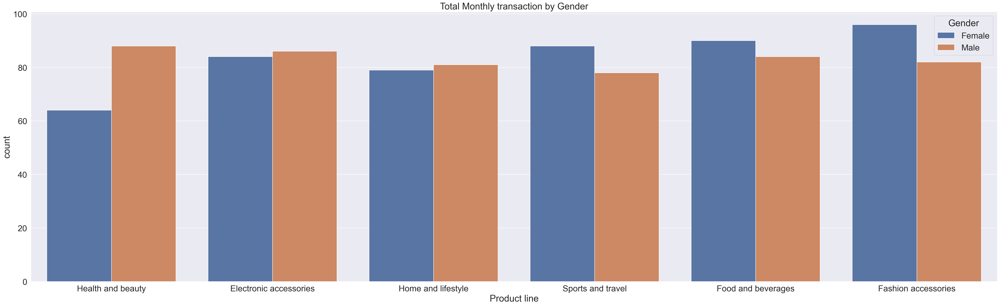

In [ ]:

plt.figure(figsize=(40, 12))
plt.title('Total Monthly transaction by Gender')
sns.countplot(df['Product line'], hue = df.Gender)


> ### Females spend on 'fashion accessories' the most and for males surprisingly it is 'Health and beauty'. Females also spend more on 'Sports and travel'

> ## Q9: Which day of the week has maximum sales?

<AxesSubplot:title={'center':'Daily Sales by Day of the Week'}, xlabel='weekday', ylabel='count'>

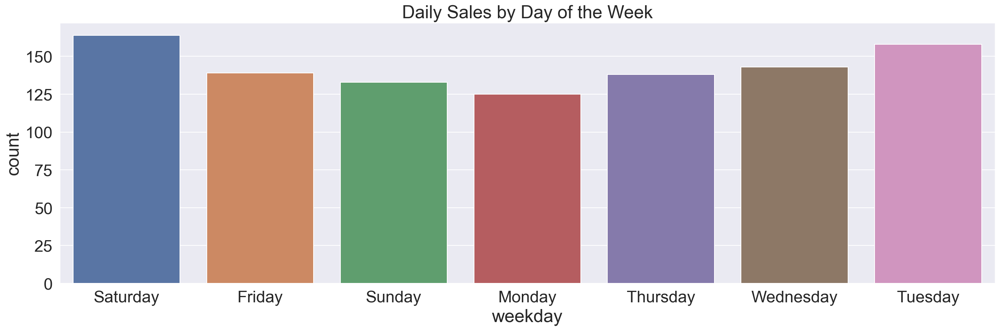

In [ ]:

plt.figure(figsize=(20, 6))
plt.title('Daily Sales by Day of the Week')
sns.countplot(df['weekday'])



> ### Sales is highest on Saturdays probably because it is the weekend. Interestingly,Tuesdays is a close second.Mondays is the lowest in sales.

> ## Q10: Which hour of the day is the busiest?

In [ ]:


df['Time'] = pd.to_datetime(df['Time'])
df['Hour'] = (df['Time']).dt.hour
df['Hour'].unique()



array([13, 10, 20, 18, 14, 11, 17, 16, 19, 15, 12], dtype=int64)

Text(0.5, 1.0, 'Product Sales per Hour')

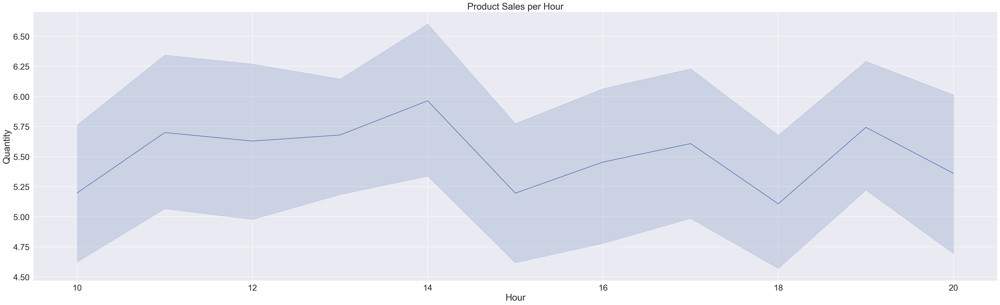

In [ ]:
sns.lineplot(x="Hour",  y = 'Quantity',data =df).set_title("Product Sales per Hour")

> ### Peak is observed in the 14th hour i.e 2 pm of the day. Hence, sales is typically higher in the afternoons.


> ## Question 11: Which product line should the supermarket focus on?
> ### a) Rating of products

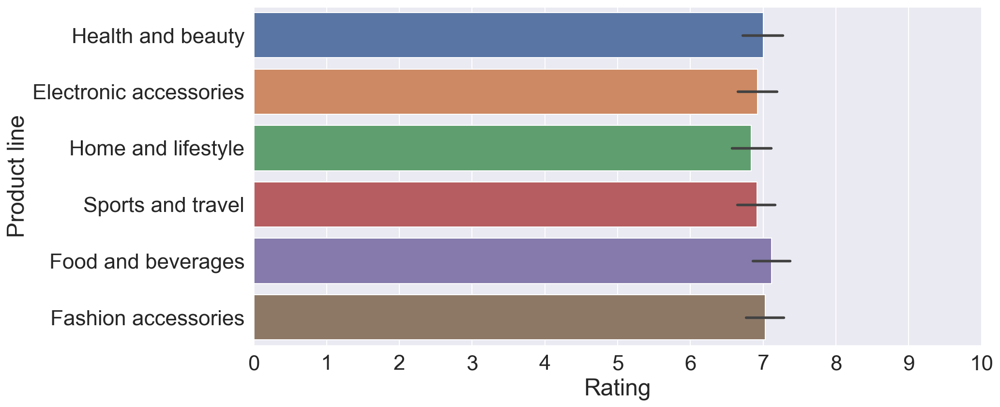

In [ ]:

xdata = [0,1,2,3,4,5,6,7,8,9,10]
plt.figure(figsize = (12,6))
sns.barplot(y = df['Product line'], x = df['Rating'])
plt.xticks(xdata);


> ### b) Quantity purchased by product

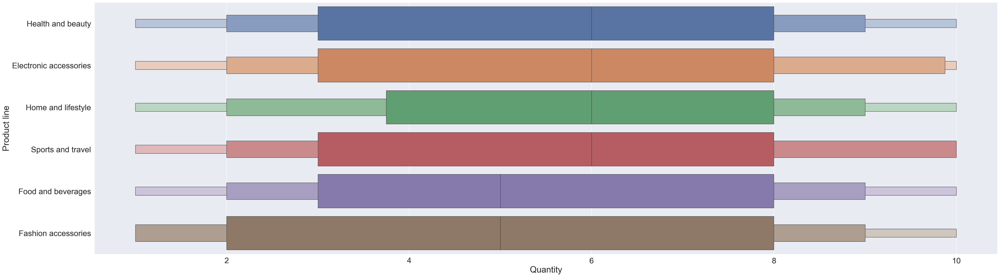

In [ ]:
sns.boxenplot(y = 'Product line', x = 'Quantity', data=df );


> ### Though the rating for 'fashion accessories' and 'food and beverages' is high but quantity purchased is low. Hence, supply for these products need to be increased.

> ## Question-12: Which city should be chosen for expansion and which products should it focus on?

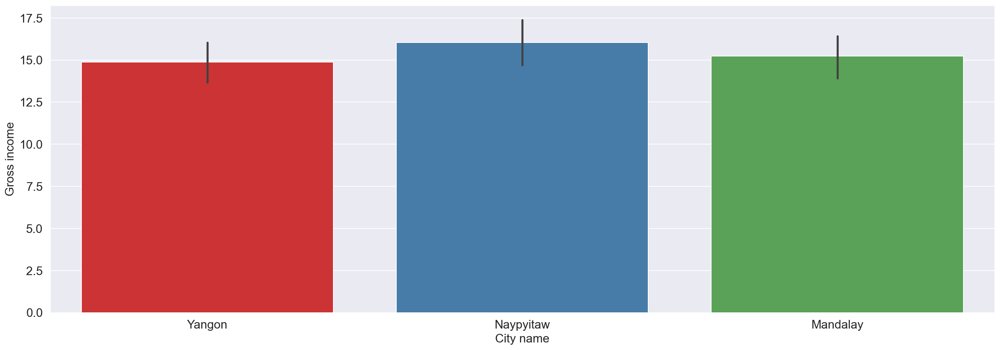

In [ ]:
plt.figure(figsize=(20,7))
sns.barplot(df['City'],df['gross income'],palette='Set1')
plt.xlabel('City name',fontsize='16')
plt.xticks(fontsize='16')
plt.ylabel('Gross income',fontsize='16')
plt.yticks(fontsize='16');

> ### It is obvious that Naypyitaw is the most profitable city, hence the expansion plan should be based on this city.

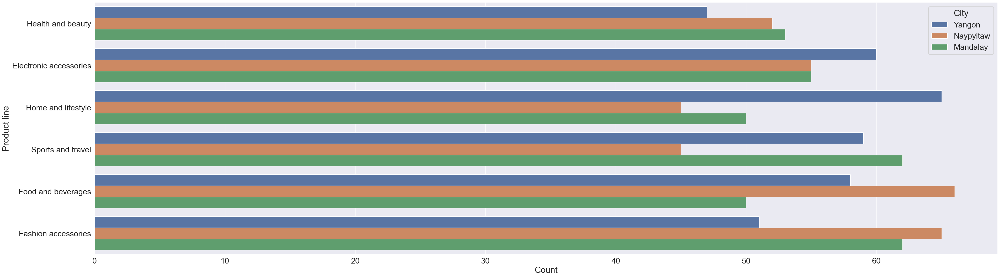

In [ ]:
plt.figure(dpi=50)
sns.countplot(y ='Product line', hue = "City", data = df) 
plt.xlabel('Count')
plt.show()

> ### Fashion accessories and food and beverages are the most sold product in Naypyitaw and these products should be focused on for expansion along with electronic accessories.

## Rating vs Sales

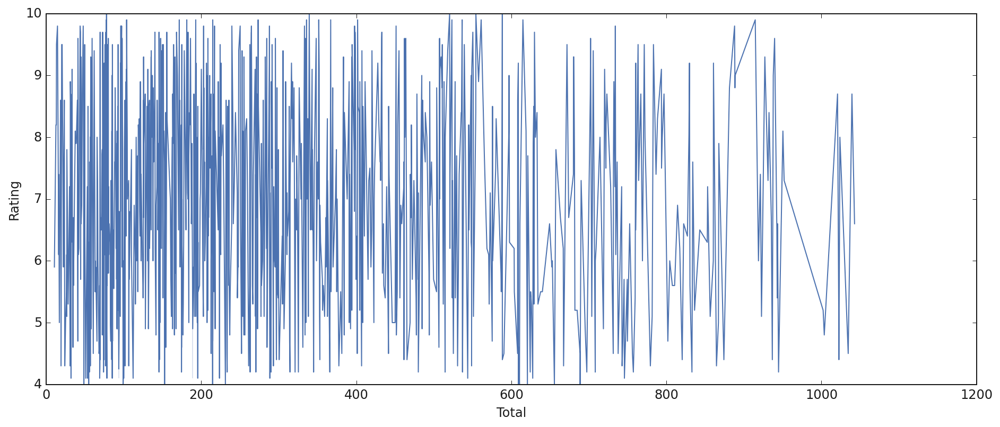

In [ ]:
plt.figure(figsize=(14,6))
plt.style.use('classic')
rating_vs_sales = sns.lineplot(x="Total", y= "Rating", data=df)

> ## Question-13 Total sales of product using boxenplot

Text(0, 0.5, 'Product Line')

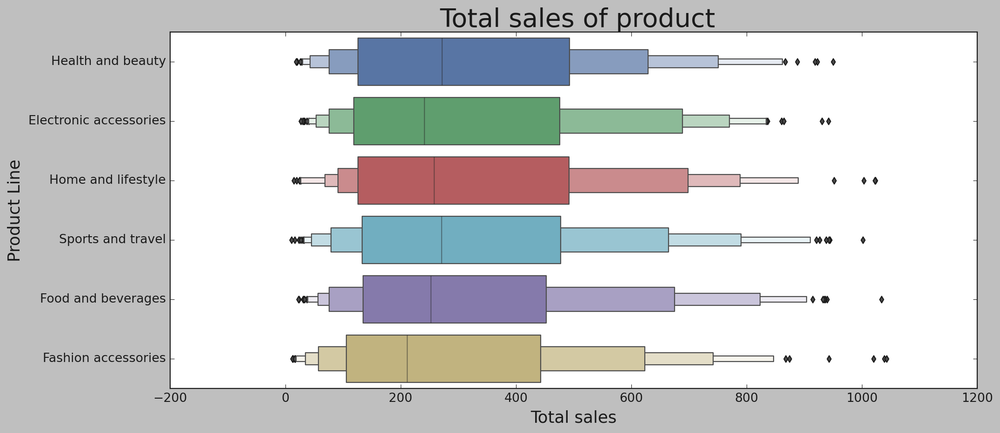

In [ ]:
plt.figure(figsize=(14,6))
plt.style.use('classic')
ax = sns.boxenplot(y= "Product line", x= "Total", data = data)
ax.set_title(label = " Total sales of product", fontsize = 25)
ax.set_xlabel(xlabel = "Total sales", fontsize = 16)
ax.set_ylabel(ylabel = "Product Line", fontsize = 16)

> ## question-14: average ratings of products.

Text(0, 0.5, 'Product line')

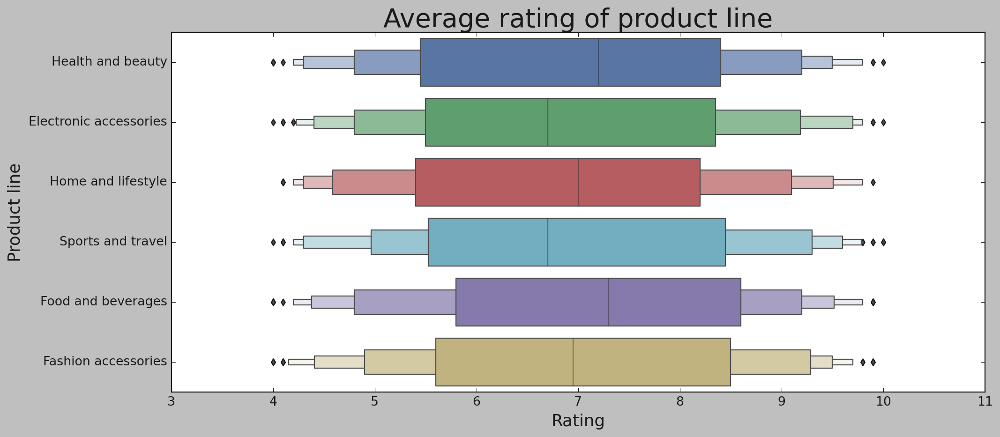

In [ ]:
plt.figure(figsize = (14,6))
plt.style.use('classic')
ax = sns.boxenplot(y = "Product line", x = "Rating", data = data)
ax.set_title("Average rating of product line", fontsize = 25)
ax.set_xlabel("Rating", fontsize = 16)
ax.set_ylabel("Product line", fontsize = 16)

> ## Question-15: Product sales on the basis of gender

Text(0, 0.5, 'Product Line')

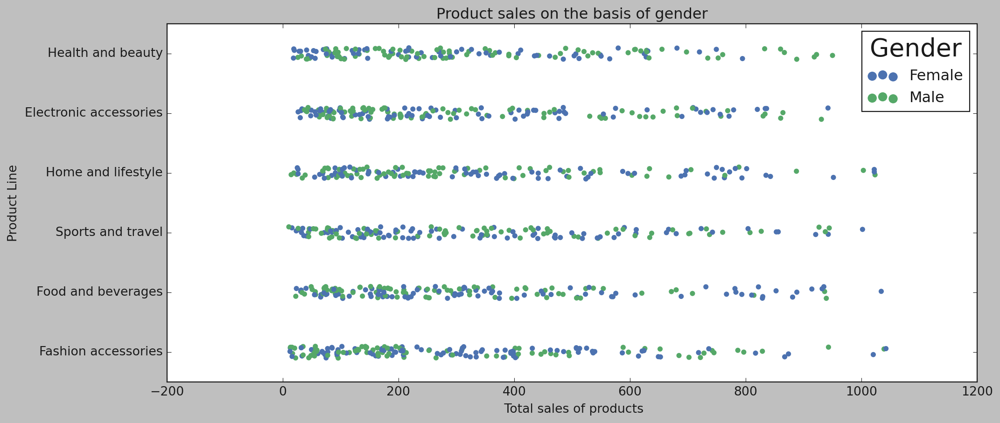

In [ ]:
plt.style.use('classic')
plt.figure(figsize = (14,6))
ax= sns.stripplot(y= "Product line", x = "Total", hue = "Gender", data = data)
ax.set_title(label = "Product sales on the basis of gender")
ax.set_xlabel(xlabel = " Total sales of products")
ax.set_ylabel(ylabel = "Product Line")

In [ ]:
df.groupby('Product line')['Gender'].value_counts()

Product line            Gender
Electronic accessories  Male      86
                        Female    84
Fashion accessories     Female    96
                        Male      82
Food and beverages      Female    90
                        Male      84
Health and beauty       Male      88
                        Female    64
Home and lifestyle      Male      81
                        Female    79
Sports and travel       Female    88
                        Male      78
Name: Gender, dtype: int64

> ### Fashion accessories, Food and beverages are the most bought products by Female customers. Electronic accessories, Health and beauty are the most bought products by Male customers.

> ## Variation between the Product and gross income

<Figure size 1120x480 with 0 Axes>

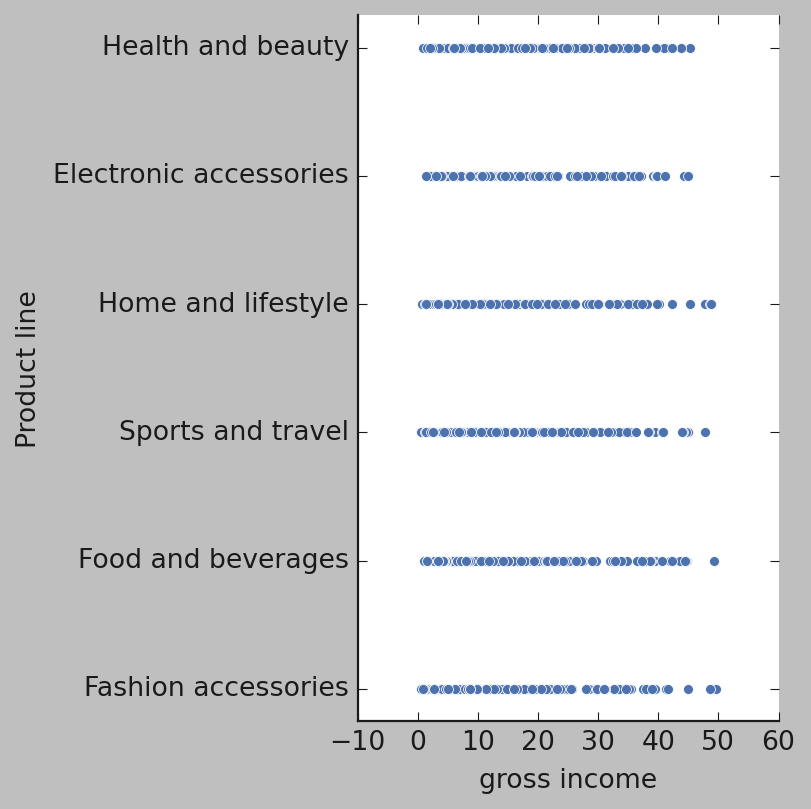

In [ ]:
plt.figure(figsize = (14,6))
plt.style.use('classic')
ax = sns.relplot(y= "Product line", x = "gross income", data = data)


> ## Question-16: how each branch's sales quantity looks like by the hour in a monthly fashion

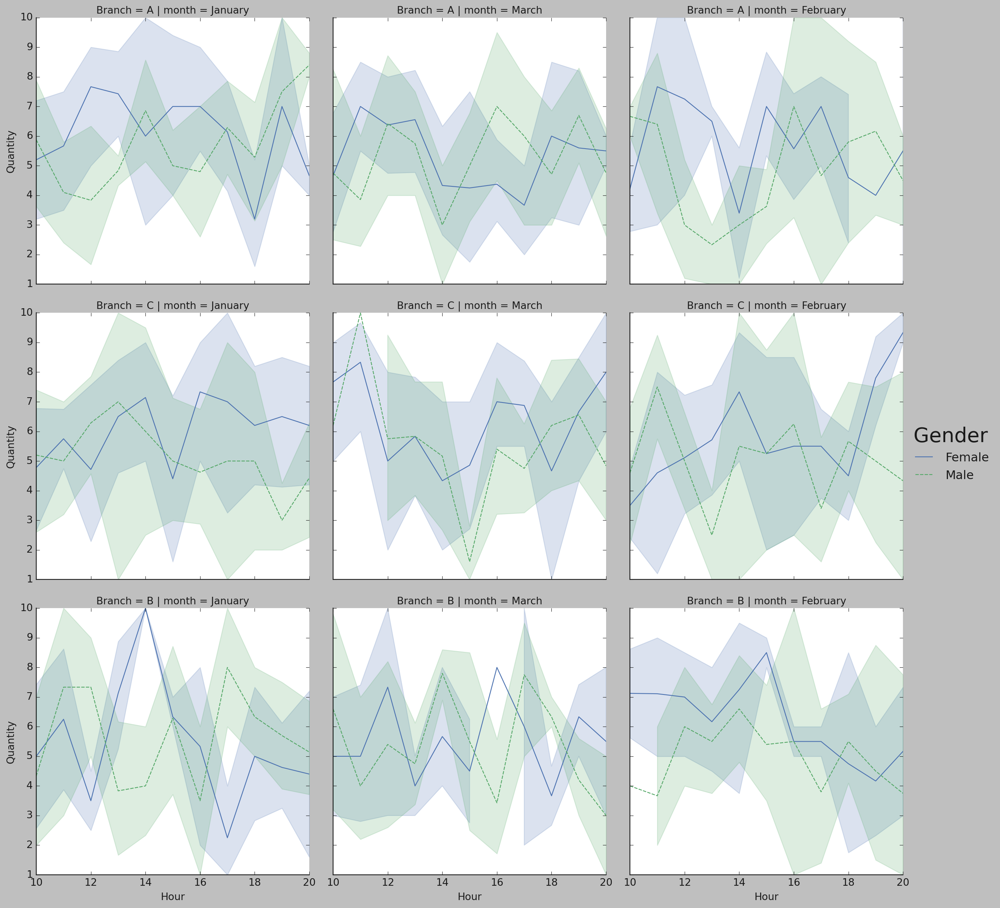

In [ ]:
genderCount  = sns.relplot(x="Hour",  y = 'Quantity', col= 'month' , row= 'Branch', kind="line", hue="Gender", style="Gender", data =df)


##  we can see each branch's sales by the hour in a monthly fashion.

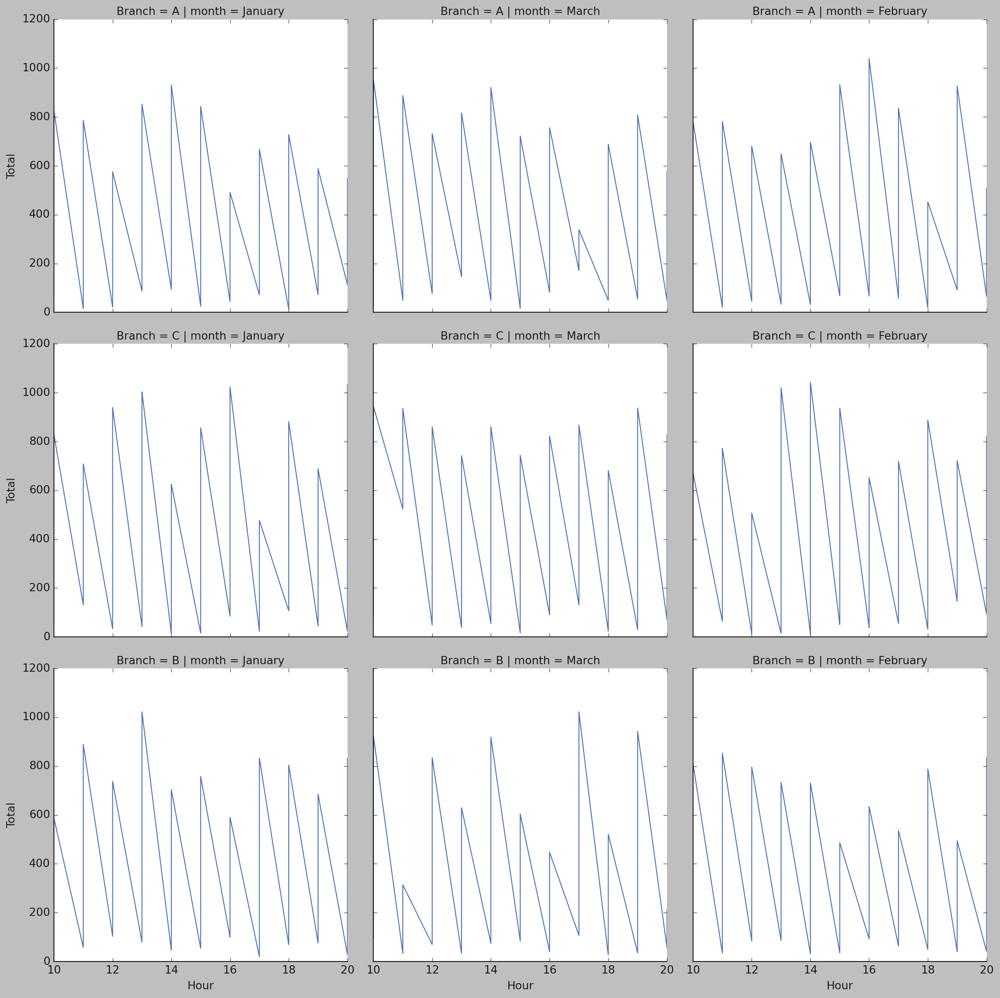

In [ ]:


genderCount  = sns.relplot(x="Hour",  y = 'Total', col= 'month' , row= 'Branch', estimator = None, kind="line", data =df)



> ## Rating vs Total

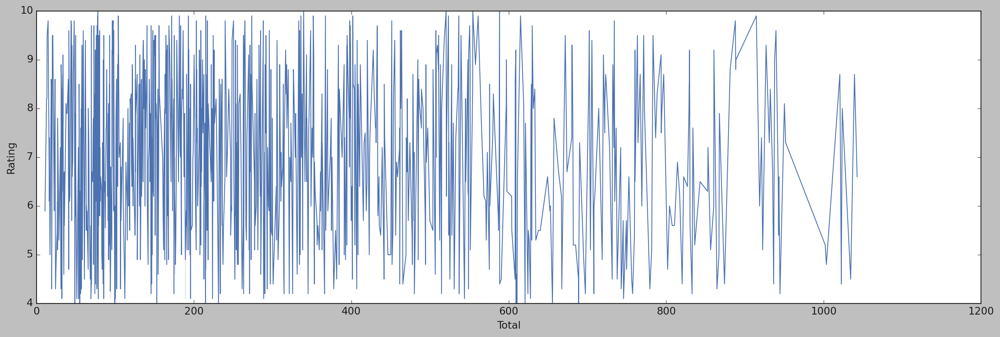

In [ ]:
plt.figure(figsize = (20,6))

ageDisSpend = sns.lineplot(x="Total", y = "Rating", data =df)



> ## Question-17: When customers buy certain products in the various branches.

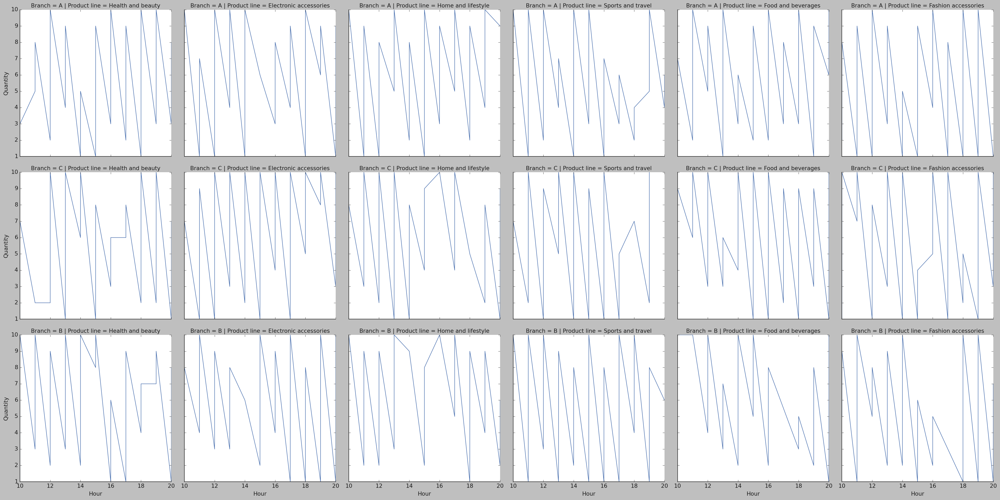

In [ ]:
productCount  = sns.relplot(x="Hour",  y = 'Quantity', col= 'Product line' , row= 'Branch', estimator = None, kind="line", data =df)

> ## Question-18 : Payment channel by each branch.

Text(0.5, 1.0, 'Payment Channel by Branch')

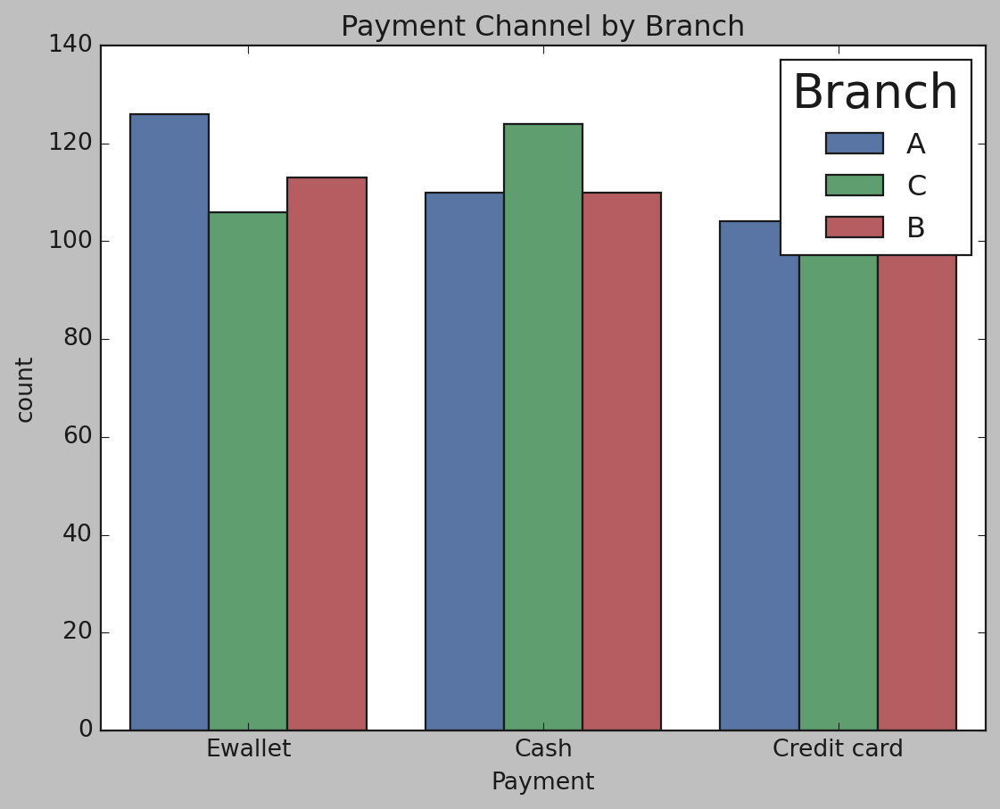

In [ ]:
sns.countplot(x="Payment", hue = "Branch", data =df).set_title("Payment Channel by Branch")


In [ ]:
df.groupby('Branch')['Payment'].value_counts()

Branch  Payment    
A       Ewallet        126
        Cash           110
        Credit card    104
B       Ewallet        113
        Cash           110
        Credit card    109
C       Cash           124
        Ewallet        106
        Credit card     98
Name: Payment, dtype: int64

> ## Question-19:Type of customer in each branch.

Text(0.5, 1.0, 'Customer Type by Branch')

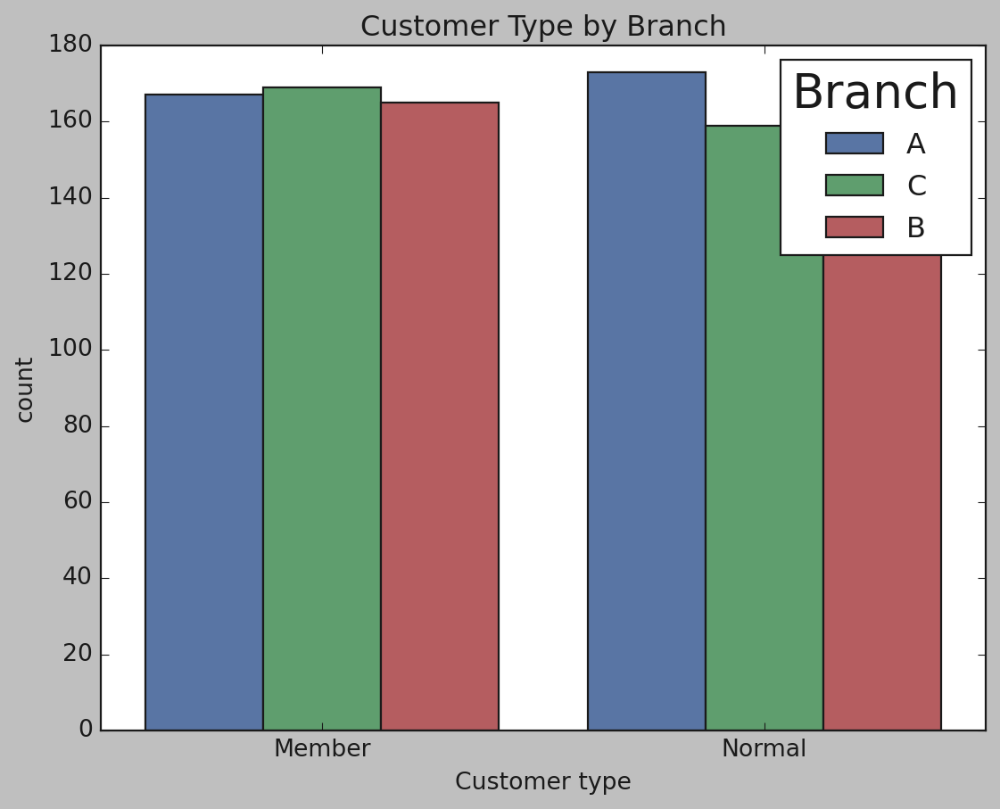

In [ ]:


sns.countplot(x="Customer type", hue = "Branch", data =df).set_title("Customer Type by Branch")



In [ ]:
df.groupby('Branch')['Customer type'].value_counts()

Branch  Customer type
A       Normal           173
        Member           167
B       Normal           167
        Member           165
C       Member           169
        Normal           159
Name: Customer type, dtype: int64

## Does customer type influences the sales

In [ ]:
df.groupby(['Customer type']).agg({'Total': 'sum'})

,Total
Customer type,
Member,164223.444
Normal,158743.305


> ## Question-20: Do the customer type influence customer rating?

Text(0.5, 1.0, 'Customer Type')

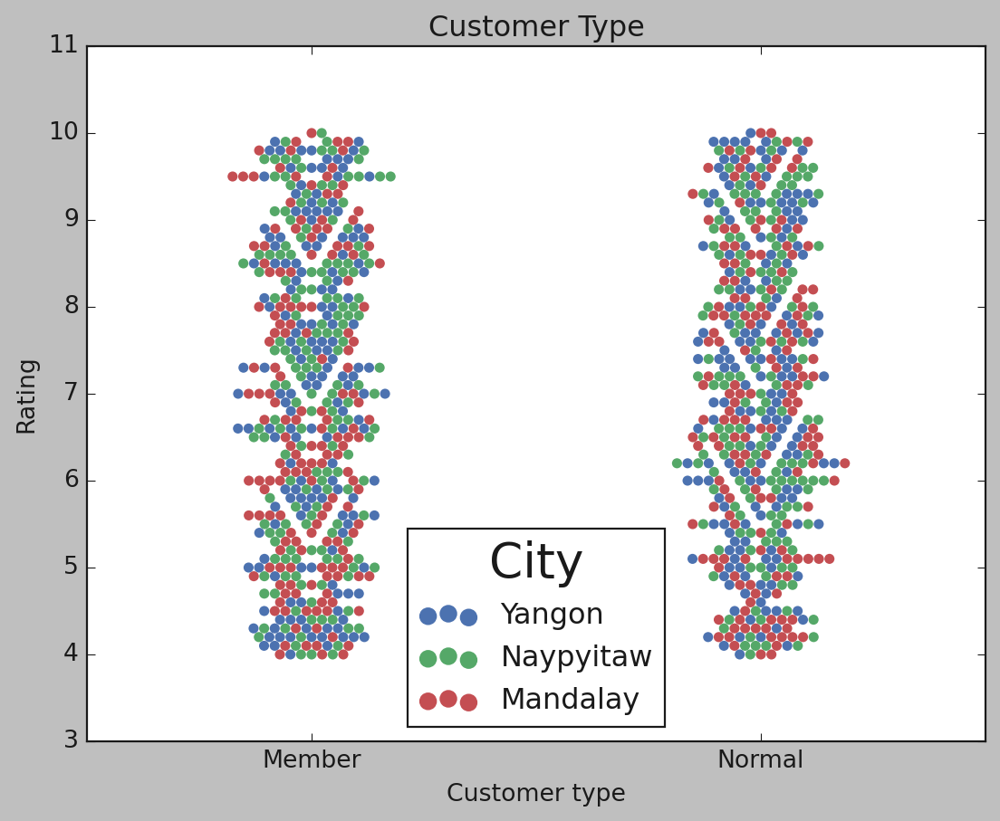

In [ ]:

sns.swarmplot(x="Customer type",  y = "Rating",  hue = "City", data =df).set_title("Customer Type")


> ## Total sale vs Quantity of the products.

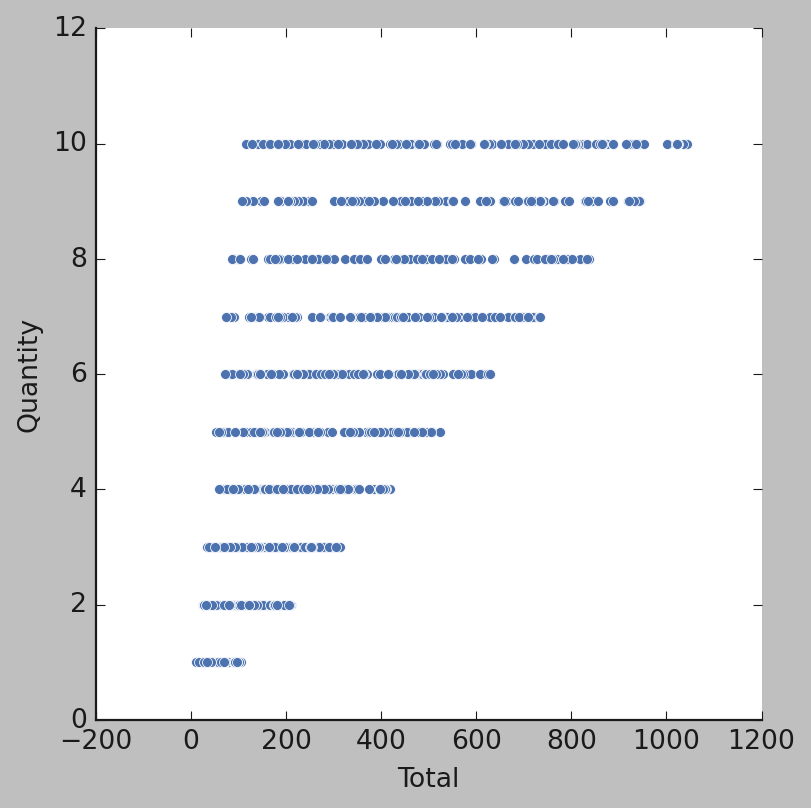

In [ ]:
sns.relplot(x="Total",  y = "Quantity", data =df)

> ## Question-21: Payment mode used by Customers in percentage.

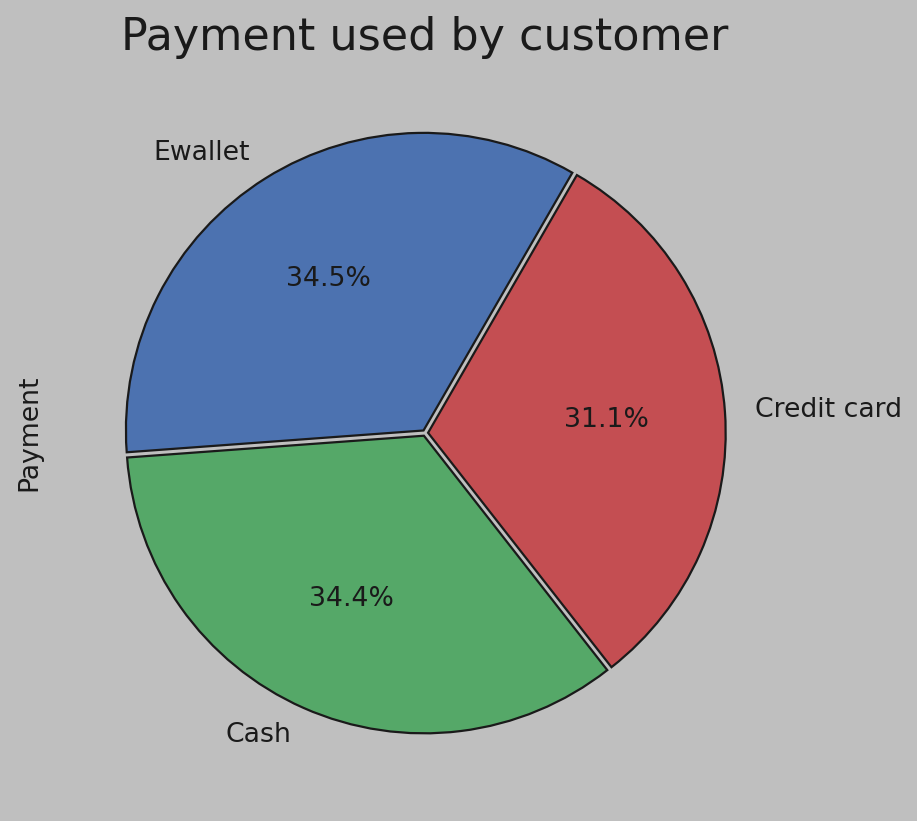

In [ ]:
plt.figure(figsize=(6,6))
df['Payment'].value_counts().plot.pie(explode=[0.01,0.01,0.01],autopct='%1.1f%%',startangle=60)
plt.title('Payment used by customer',fontsize=20)
plt.show()

> ## Rating distribution in 3 branches

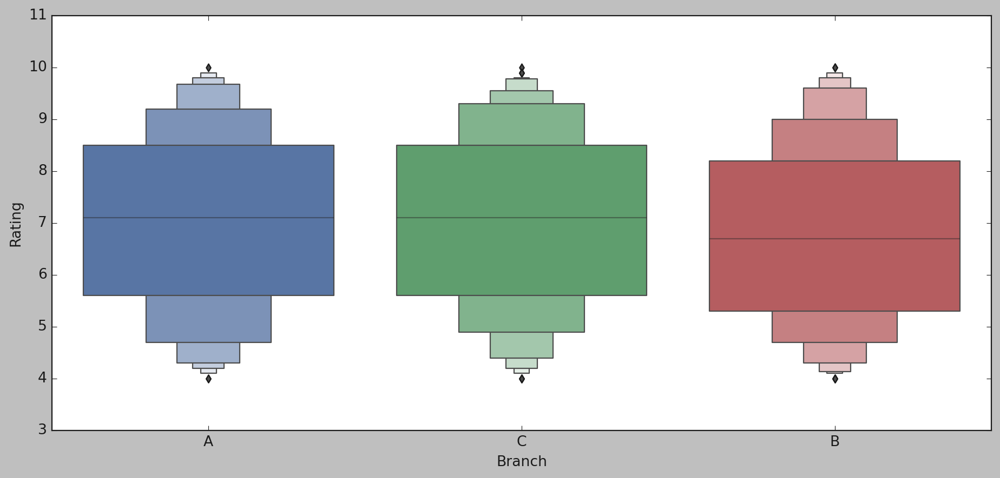

In [ ]:

plt.figure(figsize=(14,6)) 
sns.boxenplot(x="Branch", y = "Rating" ,data =df)
plt.show()


> ## Question-22: Average Rating of the product in each branch.

In [ ]:
df.groupby('Branch')['Rating'].mean()

Branch
A    7.027059
B    6.818072
C    7.072866
Name: Rating, dtype: float64

> ### We can see that the average rating of branch A and C is more than seven and branch B is less than 7.

> ## Question-23: How many product line purchased by which type of Customer type .

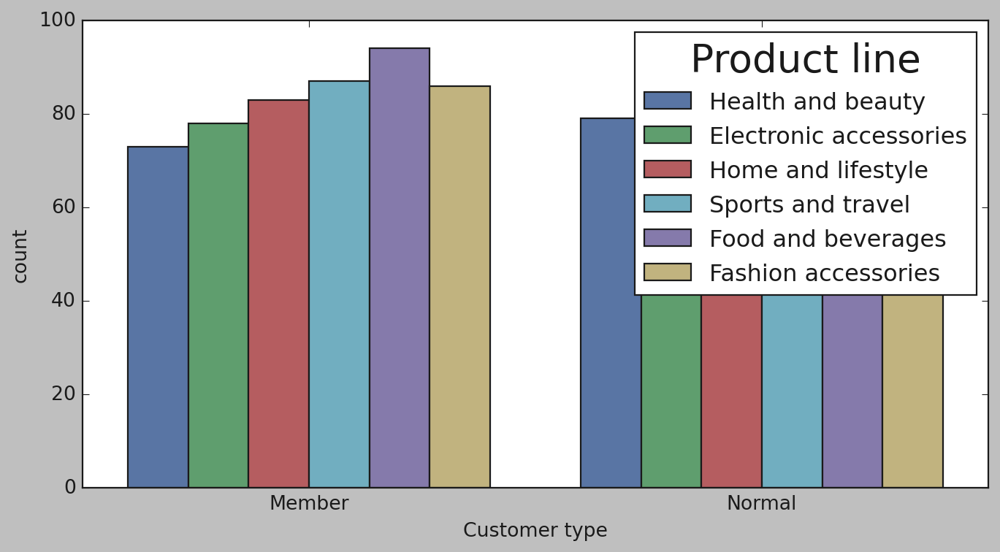

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x=df['Customer type'],hue=df['Product line'])
plt.show()

In [ ]:
pd.pivot_table(df , index = 'Customer type' , values = 'Invoice ID' , columns = 'Product line' , aggfunc = 'count')

Product line,Electronic accessories,Fashion accessories,Food and beverages,Health and beauty,Home and lifestyle,Sports and travel
Customer type,,,,,,
Member,78,86,94,73,83,87
Normal,92,92,80,79,77,79


> ## Question-24: Which Month has maximum sales?

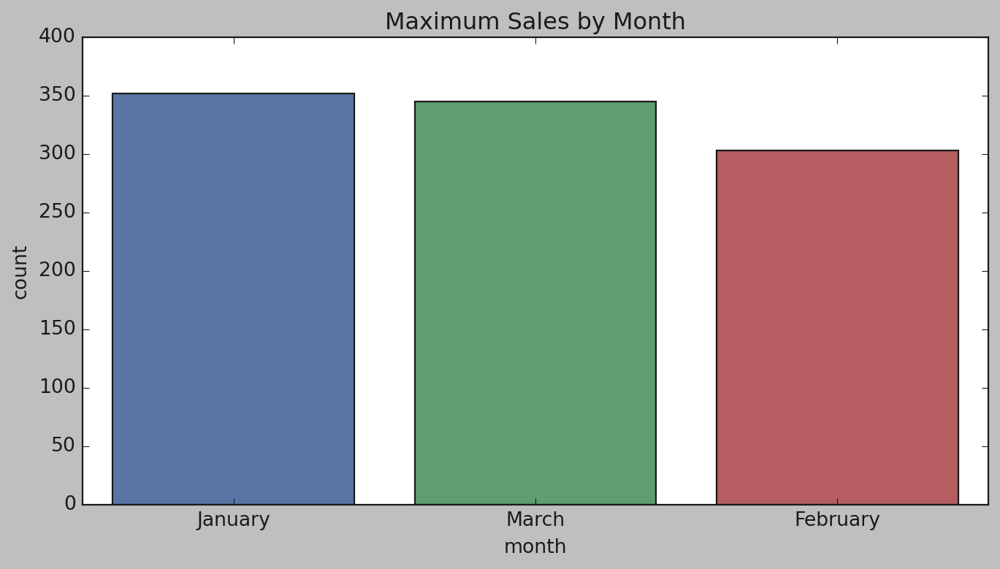

In [ ]:


plt.figure(figsize=(10, 5))
sns.countplot(df.month).set_title('Maximum Sales by Month')
plt.show()



In [ ]:
df.groupby('month')['gross income'].count().sort_values(ascending=False)

month
January     352
March       345
February    303
Name: gross income, dtype: int64

> ### Sales are highest in the month of January.

> ## Question-25: Which Product line has highest cogs ?

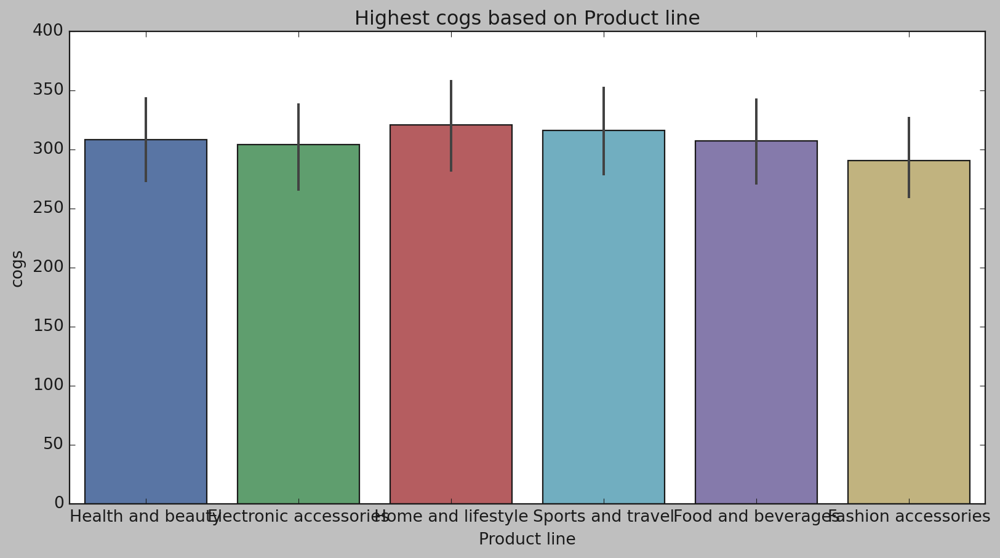

In [ ]:

plt.figure(figsize=(12,6))
sns.barplot(x=df['Product line'],y=df['cogs']).set_title("Highest cogs based on Product line")
plt.show()


In [ ]:

df.groupby('Product line')['cogs'].mean()


Product line
Electronic accessories    304.411941
Fashion accessories       290.561236
Food and beverages        307.306207
Health and beauty         308.231447
Home and lifestyle        320.606625
Sports and travel         316.252590
Name: cogs, dtype: float64


> ### Home and lifestyle, Sports and travel has highest cogs.


> ## question-26: Which Branch has highest gross icome




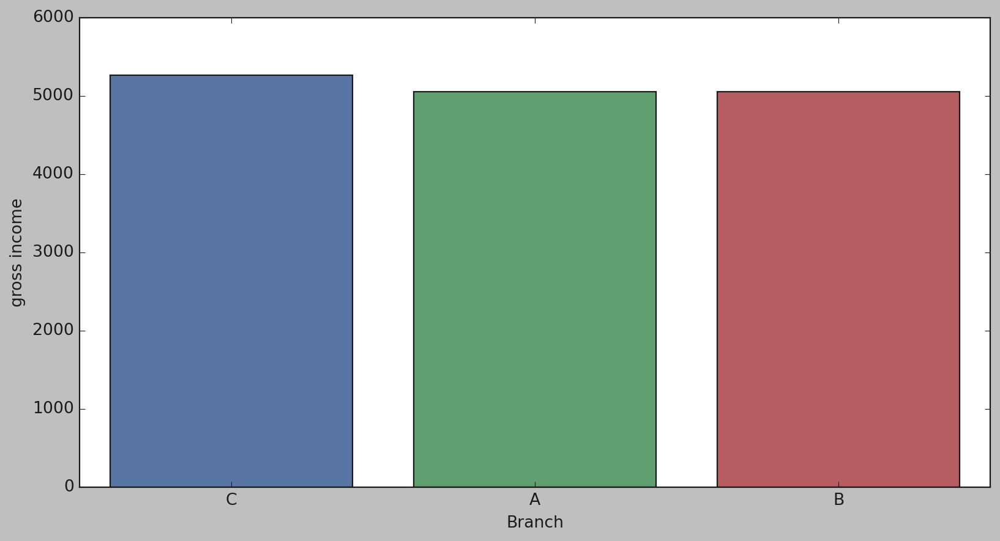

In [ ]:
branch=df[["Branch", "gross income"]].groupby(['Branch'], as_index=False).sum().sort_values(by='gross income', ascending=False)
plt.figure(figsize=(12,6))
sns.barplot(x='Branch', y='gross income',data=branch)
plt.show()

In [ ]:
pd.pivot_table(df , columns = 'Branch' , aggfunc='sum' , values = 'gross income')

Branch,A,B,C
gross income,5057.1605,5057.032,5265.1765


> ### Branch C have highest gross income.

>  ## Finding the relation between Unit price and gross income.

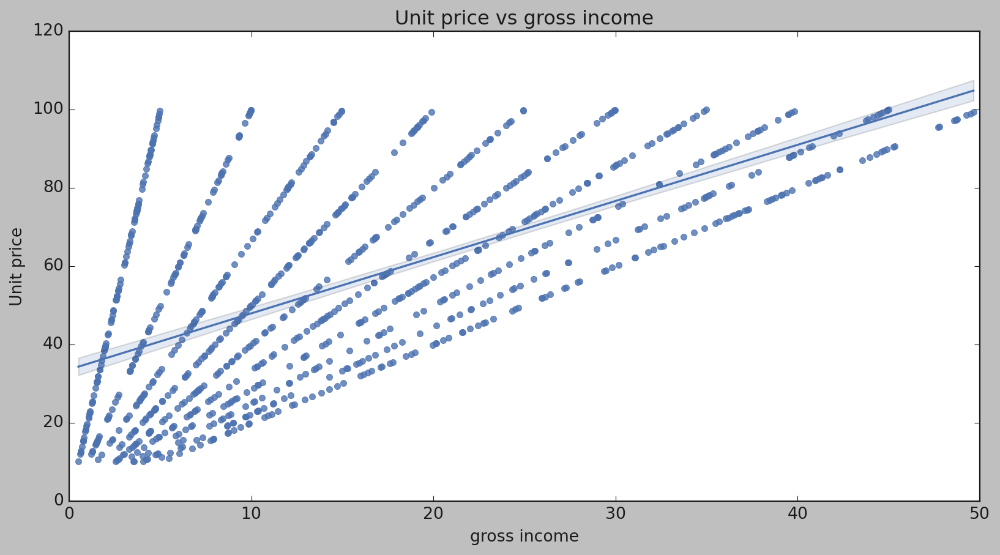

In [ ]:

plt.figure(figsize=(12,6))
sns.regplot(data = df, x = 'gross income', y = 'Unit price').set_title("Unit price vs gross income")
plt.show()




> ### People with higher gross incomes seem to be able to afford items of higher unit price.

<center>
<h1>
<hr/>
<b>
<u>
Machine Learning Model
</u>
</b>
<hr/>
</h1>
</center>

In [ ]:
# data type conversion
from sklearn.preprocessing import LabelEncoder
# re processing the data
from sklearn.preprocessing import StandardScaler
# Splitting the data
from sklearn.model_selection import train_test_split
# Algorithms
from sklearn.cluster import KMeans

In [ ]:

df1=df.copy()


In [ ]:


df1.head()



,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,Payment,cogs,gross margin percentage,gross income,Rating,weekday,day,month,year,Hour
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,...,Ewallet,522.83,4.761905,26.1415,9.1,Saturday,5,January,2019,13
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,...,Cash,76.40,4.761905,3.8200,9.6,Friday,8,March,2019,10
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,...,Credit card,324.31,4.761905,16.2155,7.4,Sunday,3,March,2019,13
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,...,Ewallet,465.76,4.761905,23.2880,8.4,Sunday,27,January,2019,20
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,...,Ewallet,604.17,4.761905,30.2085,5.3,Friday,8,February,2019,10


In [ ]:
df1.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating', 'weekday', 'day', 'month', 'year', 'Hour'],
      dtype='object')

In [ ]:
df1.drop(columns=['Invoice ID','Time','Date'],inplace=True) # dropping the columns

In [ ]:


objList = df1.select_dtypes(include = "object").columns       # extracting object data type from dataset
print (objList)                                  



Index(['Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Payment',
       'weekday', 'month'],
      dtype='object')


In [ ]:
### Converting features`m
le = LabelEncoder()
for features in objList:
    df1[features] = le.fit_transform(df1[features])
df1.info()       #Checking Info after LabelEncoding


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Branch                   1000 non-null   int32  
 1   City                     1000 non-null   int32  
 2   Customer type            1000 non-null   int32  
 3   Gender                   1000 non-null   int32  
 4   Product line             1000 non-null   int32  
 5   Unit price               1000 non-null   float64
 6   Quantity                 1000 non-null   int64  
 7   Tax 5%                   1000 non-null   float64
 8   Total                    1000 non-null   float64
 9   Payment                  1000 non-null   int32  
 10  cogs                     1000 non-null   float64
 11  gross margin percentage  1000 non-null   float64
 12  gross income             1000 non-null   float64
 13  Rating                   1000 non-null   float64
 14  weekday                  

In [ ]:


df1.head()         #Viewing Data after LabelEncoding



,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Payment,cogs,gross margin percentage,gross income,Rating,weekday,day,month,year,Hour
0,0,2,0,0,3,74.69,7,26.1415,548.9715,2,522.83,4.761905,26.1415,9.1,2,5,1,2019,13
1,2,1,1,0,0,15.28,5,3.8200,80.2200,0,76.40,4.761905,3.8200,9.6,0,8,2,2019,10
2,0,2,1,1,4,46.33,7,16.2155,340.5255,1,324.31,4.761905,16.2155,7.4,3,3,2,2019,13
3,0,2,0,1,3,58.22,8,23.2880,489.0480,2,465.76,4.761905,23.2880,8.4,3,27,1,2019,20
4,0,2,1,1,5,86.31,7,30.2085,634.3785,2,604.17,4.761905,30.2085,5.3,0,8,0,2019,10



> ### Standardization is a another reprocessing tool which transforms all the numerical values (assuming that the whole dataset is just numerical values)into values between -1 and 1. This increases the processing speed and makesusing algorithms on the data easier.


In [ ]:
scale = StandardScaler()
scaleddata = pd.DataFrame(scale.fit_transform(df1), columns=df1.columns)


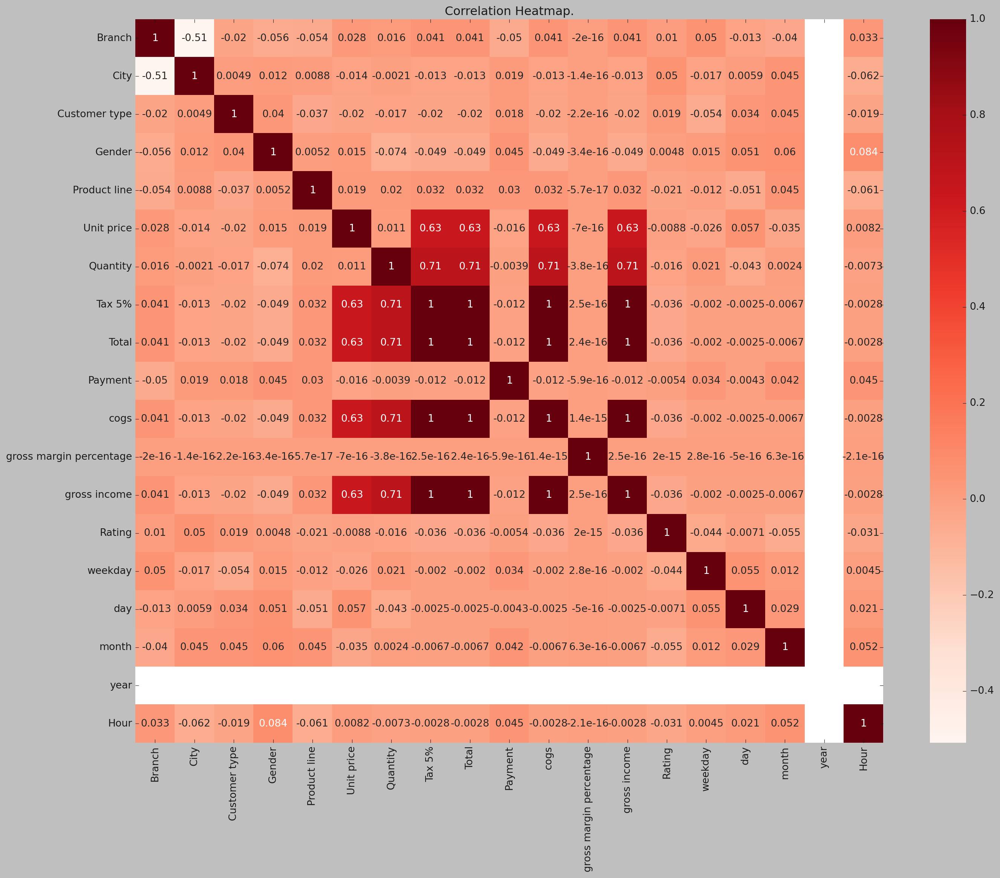

In [ ]:

# Corelation heatmap

plt.figure(figsize=(20,15))
sns.heatmap(df1.corr(),annot=True,cmap=plt.cm.Reds).set_title('Correlation Heatmap.')
plt.show()

## There is a high positive correlation between the gross income and total as well as gross income and quantity

> * ### There are no corelated variables with Rating. if we choose Rating as a target variable it effects our model performance.
> * ### So we can't use Supervised Machine Learning Algorithms here. And clearly we get know that this dataset is used for analysis.
> * ### In order to apply ML model we have to go with Un-Supervised ML. So we are using KMeans Clustering algorithm.



<center>
<h1>
<hr/>
<b>

Kmeans Machine Learning Model Building

</b>
<hr/>
</h1>
</center>


In [ ]:

# Evaluating the model performance

model = KMeans(n_clusters=4, init="k-means++",random_state=0)
model.fit(df1)


KMeans(n_clusters=4, random_state=0)

In [ ]:

clusters = model.fit_predict(df1)
clusters


array([1, 0, 2, 1, 1, 1, 1, 3, 0, 0, 0, 0, 2, 1, 3, 1, 1, 1, 0, 0, 1, 2,
       0, 0, 2, 1, 0, 0, 1, 2, 1, 3, 3, 2, 1, 0, 2, 1, 1, 2, 0, 0, 1, 3,
       0, 1, 1, 0, 0, 3, 3, 2, 0, 0, 0, 3, 0, 3, 3, 2, 0, 2, 1, 0, 2, 0,
       0, 1, 3, 0, 3, 1, 0, 1, 3, 1, 1, 0, 3, 0, 1, 2, 0, 2, 2, 1, 1, 2,
       0, 1, 2, 1, 0, 1, 0, 0, 3, 0, 0, 1, 0, 3, 2, 2, 2, 3, 0, 1, 2, 3,
       0, 2, 1, 1, 3, 0, 0, 0, 0, 0, 3, 1, 3, 1, 1, 3, 0, 2, 1, 3, 2, 1,
       0, 1, 1, 2, 0, 2, 1, 1, 3, 3, 3, 0, 1, 2, 2, 2, 1, 2, 2, 2, 3, 0,
       3, 1, 0, 2, 3, 1, 2, 0, 2, 0, 1, 2, 3, 3, 2, 1, 2, 1, 0, 2, 0, 2,
       0, 0, 1, 2, 1, 2, 0, 2, 0, 0, 3, 2, 0, 2, 2, 0, 3, 0, 0, 0, 0, 0,
       0, 2, 0, 2, 1, 2, 0, 2, 1, 2, 0, 3, 2, 3, 1, 0, 2, 0, 0, 2, 3, 0,
       2, 1, 0, 0, 0, 0, 3, 0, 1, 1, 0, 0, 3, 2, 1, 2, 0, 2, 0, 0, 2, 0,
       2, 2, 3, 1, 2, 0, 2, 1, 1, 2, 0, 0, 1, 0, 0, 0, 0, 2, 3, 0, 0, 2,
       0, 3, 0, 3, 2, 2, 2, 0, 2, 0, 1, 2, 2, 1, 3, 1, 1, 0, 0, 1, 2, 2,
       0, 2, 2, 3, 1, 2, 0, 0, 0, 2, 0, 1, 2, 0, 2,

> ### Visulazing the model
> ### Plot for the gross income and unit price of the items bought

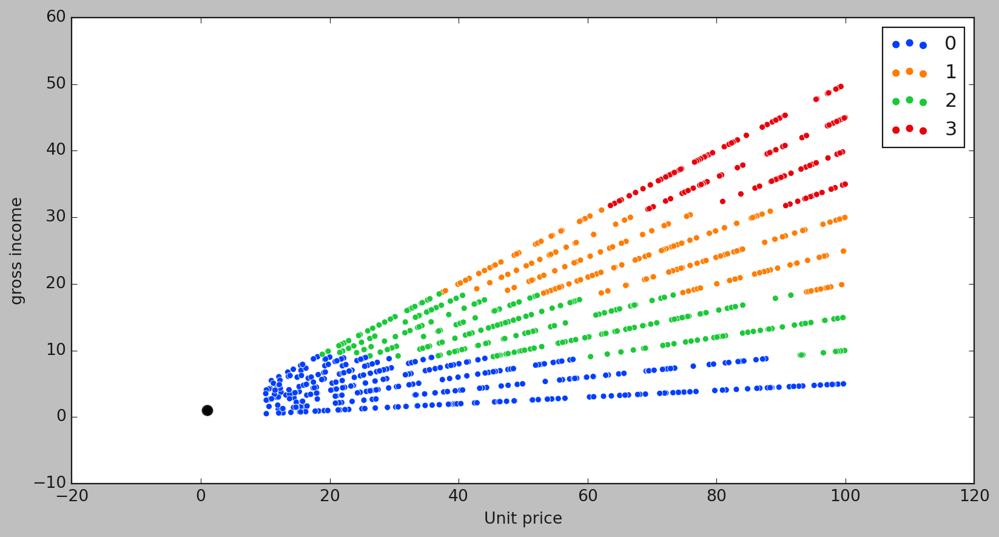

In [ ]:

plt.figure(figsize=(12,6))
sns.scatterplot(data=df1, x="Unit price", y="gross income", hue= clusters, palette = "bright")
centers = model.cluster_centers_
# Plot centers
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=50, alpha = 0.6)
plt.xlabel("Unit price")
plt.ylabel("gross income")
plt.show()


> ### Clustering the data

In [ ]:

clusters = pd.DataFrame(model.fit_predict(df1), columns=['clusters'])
richcustomers = data.loc[clusters['clusters'] == 1]
notrichcustomers = data.loc[clusters['clusters'] == 0]


> ### Plotting the countplot for the customers from each of the cities

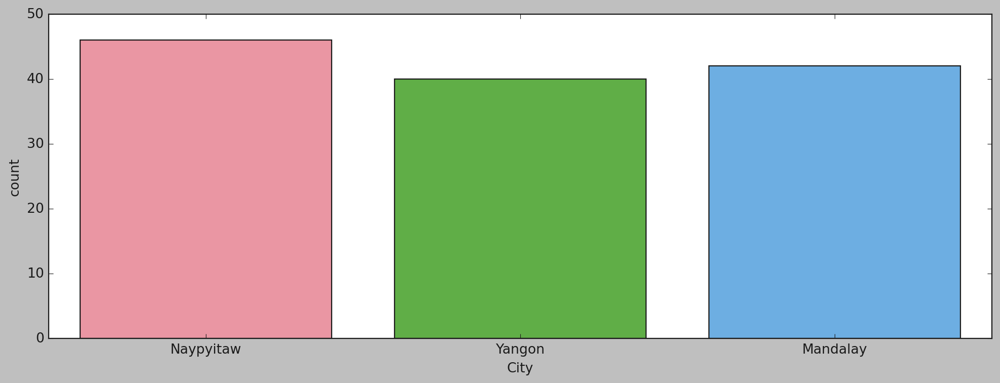

In [ ]:


plt.figure(figsize=(15,5))
sns.set_palette(['red'])
sns.countplot(richcustomers['City'])
plt.show()





> ###  Naypyitaw city has more rich customers.

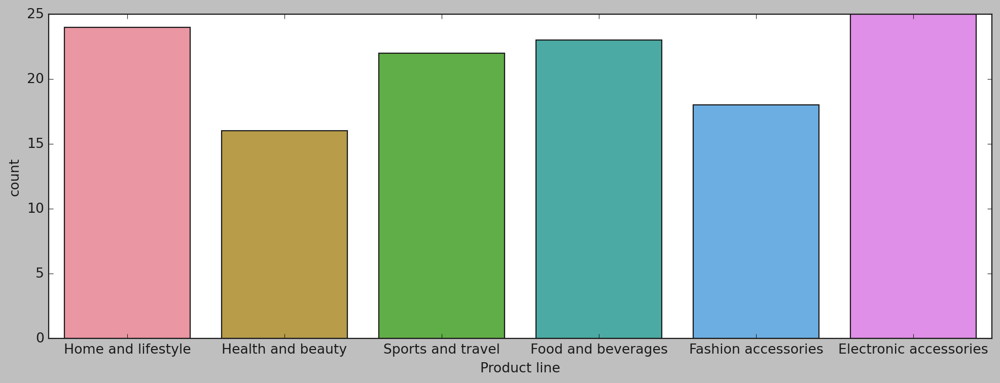

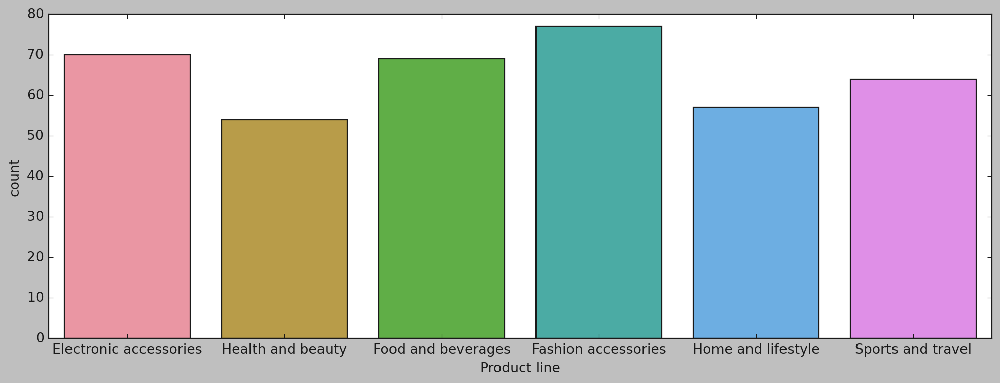

In [ ]:
# Checking what exactly do the wealthy customers and thrifters buy



plt.figure(figsize=(15,5))
sns.set_palette(['red'])
sns.countplot(richcustomers['Product line'])
plt.show()


plt.figure(figsize=(15,5))
sns.set_palette(['red'])
sns.countplot(notrichcustomers['Product line'])
plt.show()

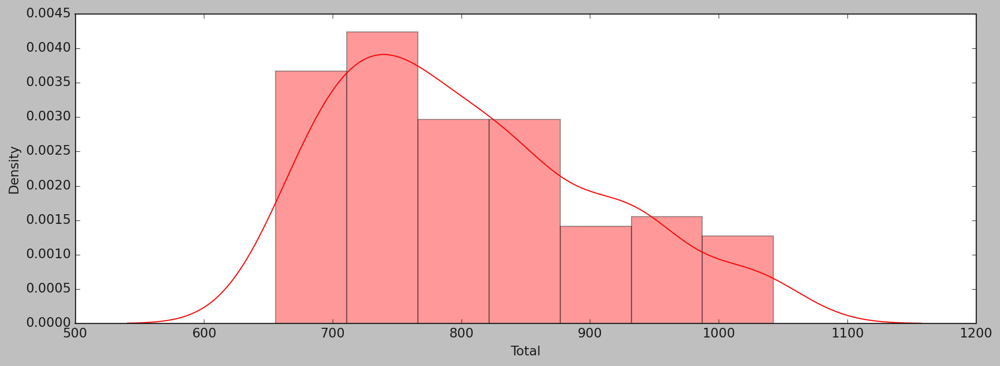

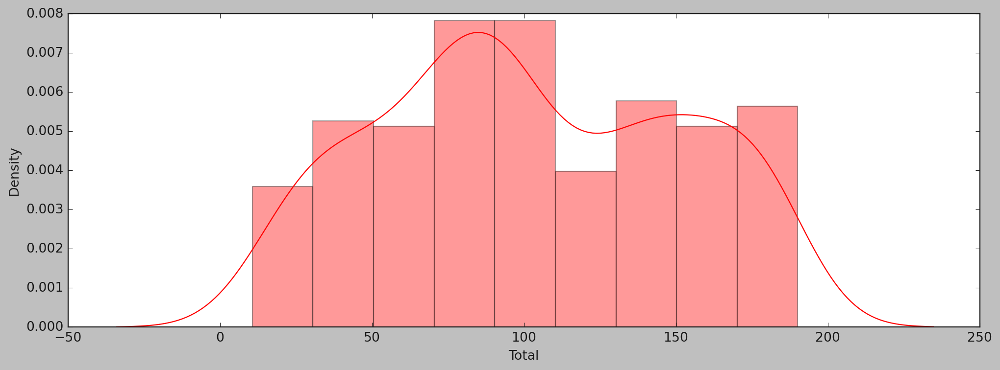

In [ ]:

# Comparing the total value of items bought by the wealthy and the thrifters
plt.figure(figsize=(15,5))
sns.set_palette(['red'])
sns.distplot(richcustomers['Total'])
plt.show()

plt.figure(figsize=(15,5))
sns.set_palette(['red'])
sns.distplot(notrichcustomers['Total'])
plt.show()



> ## Clearly the clustering algorithm (KMeans) is working fine. The wealthy customers pay way more than the thrifters and this can be clearly seen in the distributions.


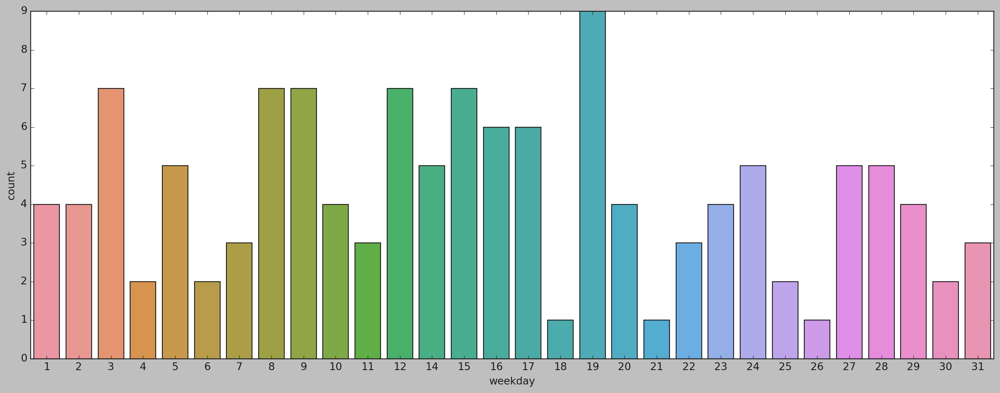

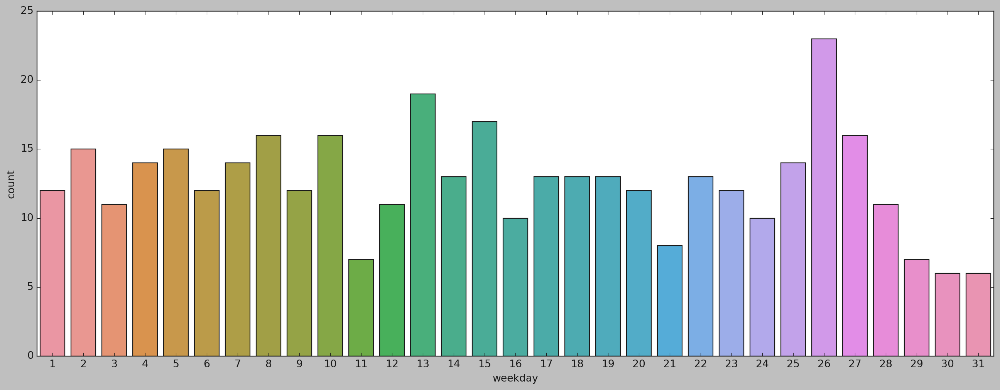

In [ ]:


richcustomers['Date'] = pd.to_datetime(richcustomers['Date'])
richcustomers['weekday'] = richcustomers['Date'].dt.day
plt.figure(figsize=(20,7))
sns.countplot(richcustomers['weekday'])
plt.show()




notrichcustomers['Date'] = pd.to_datetime(notrichcustomers['Date'])
notrichcustomers['weekday'] = notrichcustomers['Date'].dt.day
plt.figure(figsize=(20,7))
sns.countplot(notrichcustomers['weekday'])
plt.show()



> ## Clearly, what is clearly visible here is that the supermarket gets more visitors during particular days of the month.In the case of the wealthy customers the peak day of all three months is the 19th day of the respective month.In the case of the thrift shoppers, the peak day of each month is the 26th day of the month.

<center>
<h1>
<hr/>
<b>
Applying Prophet Model For Future Sales Prediction 
</b>
<hr/>
</h1>
</center>


In [ ]:
data_clean = df.copy()

In [ ]:
prophet_datasets = data_clean.rename(columns={'Date':'ds', 'cogs':'y'})

In [ ]:
prophet_datasets

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,...,Payment,y,gross margin percentage,gross income,Rating,weekday,day,month,year,Hour
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,...,Ewallet,522.83,4.761905,26.1415,9.1,Saturday,5,January,2019,13
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,...,Cash,76.40,4.761905,3.8200,9.6,Friday,8,March,2019,10
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,...,Credit card,324.31,4.761905,16.2155,7.4,Sunday,3,March,2019,13
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,...,Ewallet,465.76,4.761905,23.2880,8.4,Sunday,27,January,2019,20
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,...,Ewallet,604.17,4.761905,30.2085,5.3,Friday,8,February,2019,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,...,Ewallet,40.35,4.761905,2.0175,6.2,Tuesday,29,January,2019,13
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,...,Ewallet,973.80,4.761905,48.6900,4.4,Saturday,2,March,2019,17
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,...,Cash,31.84,4.761905,1.5920,7.7,Saturday,9,February,2019,13
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,...,Cash,65.82,4.761905,3.2910,4.1,Friday,22,February,2019,15


In [ ]:
import fbprophet
from fbprophet import Prophet

ModuleNotFoundError: No module named 'fbprophet'

In [ ]:
p = Prophet()
p.fit(prophet_datasets)

In [ ]:



future = p.make_future_dataframe(periods=15, freq='D')
future



In [ ]:
forecats = p.predict(future)
forecats

In [ ]:
plt.figure(figsize = (40,6))
p.plot(forecats, uncertainty=True)

In [ ]:
forecats[-15:]['yhat']

In [ ]:

plt.figure(figsize=(20, 6))
plt.title('Forcats values of sales')
plt.plot(forecats[:]['yhat']);
plt.xticks(size=20)
plt.yticks(size=20)
plt.show();


<center>
    <hr/>
    <h1>
    <b>
       **** Thank You ****
    </b>
    </h1>
    <hr/>
</center>